# **MACHINE LEARNING AND ENSEMBLE LEARNING FOR SCALE FORMATION PREDICTION IN GEOTHERMAL WELLS**
```python
This notebook implements a machine learning system combining 3 individual models with PLEM ensemble method to predict scale formation in geothermal/oil wells.


### **Created by: Laba-laba Bali Team for VORTEX 2026 Competition**
```python
Member of Team:
- Andika Sukmana
- Abhipraya Sava O
- Bryan Asa Sumirat

JAN 2026

<img src="https://www.merusoilandgas.com/wp-content/uploads/2019/04/Scaling.jpg" width="800" align="center"/>


Mineral scaling is a common problem in geothermal power facilities. This scale deposition is usually caused by changes in the geothermal fluid temperature or composition and chemistry. Precipitation of minerals can limit fluid flow within the steam field equipment, reducing plant efficiency and increasing maintenance costs.
A layer of scaling is commonly found in most parts of the geothermal steam gathering system. However, significant amounts of deposited mineral scales are usually observed in the pipelines and vessels that handle silica super-saturated brines.

# **1. Import Libraries and Load Data**
```

In [1]:
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

# importing rdkit
# from rdkit import Chem
# from rdkit.Chem import AllChem
# from rdkit.Chem import Descriptors
# from rdkit import RDConfig
# from rdkit.Chem.Draw import IPythonConsole
# from rdkit.Chem import Draw
# #from utility import FeatureGenerator
# from rdkit.Chem import PandasTools as PandasTools
# from rdkit import DataStructs
# from rdkit.Chem.Subshape import SubshapeBuilder,SubshapeAligner,SubshapeObjects

#importing sklearn 
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
import pandas as pd


In [2]:
# from rdkit.Chem import AllChem
# from rdkit import Chem
import pandas as pd

# Load the dataset 
df = pd.read_excel("Dataset-Scale.XLSX")
df.head()


,pH,ICP_Al,ICP_B,ICP_Ba,ICP_HCO3,ICP_Ca,ICP_Cl,ICP_Cu,ICP_Fe,ICP_K,...,ICP_Zn,CaSO4-Anhydrite,CaCO3-Aragonite,BaSO4-Barite,CaCO3-Calcite,SrSO4-Celestite,CaSO4:2H2O-Gypsum,NaCl-Halite,SiO2-Quartz,FeCO3-Siderite
0,6.14,9.385,391.6,17.50,337.233,14970,167428,0.000,204.3,6605,...,14.85,-0.37,0.38,1.66,0.52,0.31,-0.16,0.05,2.15,-0.37
1,6.24,12.410,510.5,48.13,475.290,18980,154541,0.174,274.0,7847,...,16.01,-0.46,0.69,1.91,0.83,0.37,-0.24,-0.05,2.12,0.11
2,6.21,4.361,503.2,48.78,518.180,19240,135505,1.125,328.1,7221,...,18.16,-0.48,0.65,1.91,0.79,0.44,-0.22,-0.31,2.05,0.31
3,6.01,13.150,480.2,46.57,235.950,19890,143779,0.848,162.0,7845,...,36.82,-0.35,0.15,1.99,0.29,0.48,-0.11,-0.20,2.20,-0.66
4,6.07,14.690,478.2,52.26,250.630,20300,147964,0.000,207.2,7763,...,41.17,-0.32,0.24,2.06,0.38,0.55,-0.08,-0.20,2.47,-0.44


In [3]:
# from pycaret.datasets import get data
# df = get_data('Dataset-Scale', profile = True)

In [4]:
df.describe()

,pH,ICP_Al,ICP_B,ICP_Ba,ICP_HCO3,ICP_Ca,ICP_Cl,ICP_Cu,ICP_Fe,ICP_K,...,ICP_Zn,CaSO4-Anhydrite,CaCO3-Aragonite,BaSO4-Barite,CaCO3-Calcite,SrSO4-Celestite,CaSO4:2H2O-Gypsum,NaCl-Halite,SiO2-Quartz,FeCO3-Siderite
count,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,...,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000,2312.000000
mean,5.955551,13.047333,448.044100,27.859329,248.580732,18036.750000,154813.993080,0.140919,198.778212,6999.242647,...,23.338179,-0.434888,0.064749,1.651959,0.207111,0.304957,-0.206557,-0.072950,2.242725,-0.742876
std,0.196676,8.047303,121.871579,14.510372,120.804658,3375.501021,13138.498535,0.314325,104.363305,1482.844648,...,15.060195,0.156863,0.287626,0.307779,0.287661,0.160091,0.145571,0.168045,0.251154,0.572173
min,5.130000,1.602000,71.760000,0.000000,100.060000,2715.000000,116133.000000,0.000000,5.935000,0.000000,...,0.000000,-1.800000,-1.450000,-0.700000,-1.300000,-0.960000,-1.480000,-1.100000,1.270000,-6.760000
25%,5.834000,10.850000,362.175000,17.405000,179.360000,15630.000000,147114.750000,0.000000,140.700000,5999.750000,...,13.300000,-0.512500,-0.122500,1.500000,0.020000,0.210000,-0.280000,-0.170000,2.080000,-1.030000
50%,5.960000,12.680000,435.300000,24.620000,223.410000,18200.000000,156652.500000,0.000000,178.000000,6922.500000,...,21.435000,-0.430000,0.050000,1.670000,0.190000,0.300000,-0.210000,-0.050000,2.230000,-0.760000
75%,6.070000,14.450000,524.250000,37.702500,284.047500,20312.500000,164250.000000,0.140250,229.400000,7923.500000,...,31.342500,-0.350000,0.242500,1.840000,0.390000,0.390000,-0.130000,0.050000,2.410000,-0.420000
max,6.850000,227.800000,1070.000000,83.440000,2489.890000,30790.000000,195728.000000,3.542000,2488.000000,14410.000000,...,208.900000,1.360000,1.700000,3.260000,1.850000,1.960000,1.580000,0.470000,2.980000,1.600000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2312 entries, 0 to 2311
Data columns (total 28 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   pH                 2312 non-null   float64
 1   ICP_Al             2312 non-null   float64
 2   ICP_B              2312 non-null   float64
 3   ICP_Ba             2312 non-null   float64
 4   ICP_HCO3           2312 non-null   float64
 5   ICP_Ca             2312 non-null   int64  
 6   ICP_Cl             2312 non-null   int64  
 7   ICP_Cu             2312 non-null   float64
 8   ICP_Fe             2312 non-null   float64
 9   ICP_K              2312 non-null   int64  
 10  ICP_Mg             2312 non-null   float64
 11  ICP_Mn             2312 non-null   float64
 12  ICP_Na             2312 non-null   int64  
 13  ICP_Pb             2312 non-null   float64
 14  ICP_S              2312 non-null   float64
 15  ICP_Sulfate        2312 non-null   float64
 16  ICP_Si             2312 

# **2. Data Preprocessing and EDA**
```

### **2.1 Remove the missing values**

In [6]:
df.isnull().sum()

pH                   0
ICP_Al               0
ICP_B                0
ICP_Ba               0
ICP_HCO3             0
ICP_Ca               0
ICP_Cl               0
ICP_Cu               0
ICP_Fe               0
ICP_K                0
ICP_Mg               0
ICP_Mn               0
ICP_Na               0
ICP_Pb               0
ICP_S                0
ICP_Sulfate          0
ICP_Si               0
ICP_Sr               0
ICP_Zn               0
CaSO4-Anhydrite      0
CaCO3-Aragonite      0
BaSO4-Barite         0
CaCO3-Calcite        0
SrSO4-Celestite      0
CaSO4:2H2O-Gypsum    0
NaCl-Halite          0
SiO2-Quartz          0
FeCO3-Siderite       0
dtype: int64

In [7]:
df.dropna(inplace = True)

### **2.2. Heatmap**


Features shape: (2312, 19)
Target shape (multi-label): (2312, 9)

Features:
['pH', 'ICP_Al', 'ICP_B', 'ICP_Ba', 'ICP_HCO3', 'ICP_Ca', 'ICP_Cl', 'ICP_Cu', 'ICP_Fe', 'ICP_K', 'ICP_Mg', 'ICP_Mn', 'ICP_Na', 'ICP_Pb', 'ICP_S', 'ICP_Sulfate', 'ICP_Si', 'ICP_Sr', 'ICP_Zn']

Target labels:
['CaSO4-Anhydrite', 'CaCO3-Aragonite', 'BaSO4-Barite', 'CaCO3-Calcite', 'SrSO4-Celestite', 'CaSO4:2H2O-Gypsum', 'NaCl-Halite', 'SiO2-Quartz', 'FeCO3-Siderite']

Target distribution per label:

CaSO4-Anhydrite
CaSO4-Anhydrite
-0.42    86
-0.39    80
-0.47    78
-0.49    75
-0.41    75
         ..
-0.04     1
 1.36     1
-0.88     1
-1.33     1
 1.19     1
Name: count, Length: 102, dtype: int64
Imbalance ratio (0/1): inf

CaCO3-Aragonite
CaCO3-Aragonite
-0.01    43
 0.19    41
 0.03    40
 0.06    40
-0.07    39
         ..
-0.63     1
-0.61     1
 0.80     1
 0.76     1
 1.70     1
Name: count, Length: 162, dtype: int64
Imbalance ratio (0/1): 26.00

BaSO4-Barite
BaSO4-Barite
 1.68    47
 1.62    44
 1.75    

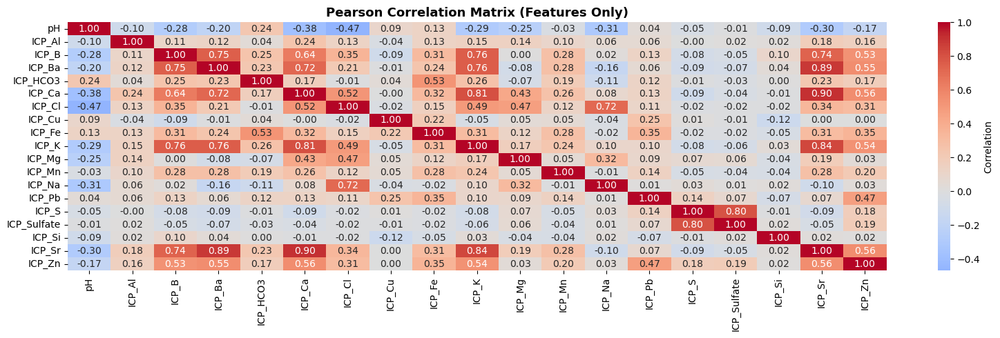


Highly correlated features (|corr| > 0.9):
  ICP_Ca <-> ICP_Sr: 0.903


In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Features
X = df.iloc[:, 0:19]

# Multi-label target
y = df.iloc[:, 19:28]

print(f"\nFeatures shape: {X.shape}")
print(f"Target shape (multi-label): {y.shape}")

print(f"\nFeatures:")
print(X.columns.tolist())

print(f"\nTarget labels:")
print(y.columns.tolist())

print("\nTarget distribution per label:")

imbalance_summary = {}

for col in y.columns:
    vc = y[col].value_counts()

    count_0 = vc.get(0, 0)
    count_1 = vc.get(1, 0)

    # avoid division by zero
    ratio = count_0 / count_1 if count_1 != 0 else float('inf')

    imbalance_summary[col] = {
        'No-scale (0)': count_0,
        'Scale (1)': count_1,
        'Imbalance Ratio (0/1)': ratio
    }

    print(f"\n{col}")
    print(vc)
    print(f"Imbalance ratio (0/1): {ratio:.2f}")


# Optional: convert imbalance summary to DataFrame
imbalance_df = pd.DataFrame(imbalance_summary).T
print("\nImbalance summary table:")
print(imbalance_df)

fig, ax = plt.subplots(figsize=(16, 5))

corr_matrix = X.corr(method='pearson')

sns.heatmap(
    corr_matrix,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    center=0,
    ax=ax,
    cbar_kws={'label': 'Correlation'}
)

ax.set_title('Pearson Correlation Matrix (Features Only)',
             fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

high_corr_pairs = []

threshold = 0.9

for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr_val = corr_matrix.iloc[i, j]
        if abs(corr_val) > threshold:
            high_corr_pairs.append(
                (corr_matrix.columns[i],
                 corr_matrix.columns[j],
                 corr_val)
            )

if high_corr_pairs:
    print("\nHighly correlated features (|corr| > 0.9):")
    for feat1, feat2, corr_val in high_corr_pairs:
        print(f"  {feat1} <-> {feat2}: {corr_val:.3f}")
else:
    print("\nNo highly correlated features (|corr| > 0.9) found")

### **2.3. Pairplot**

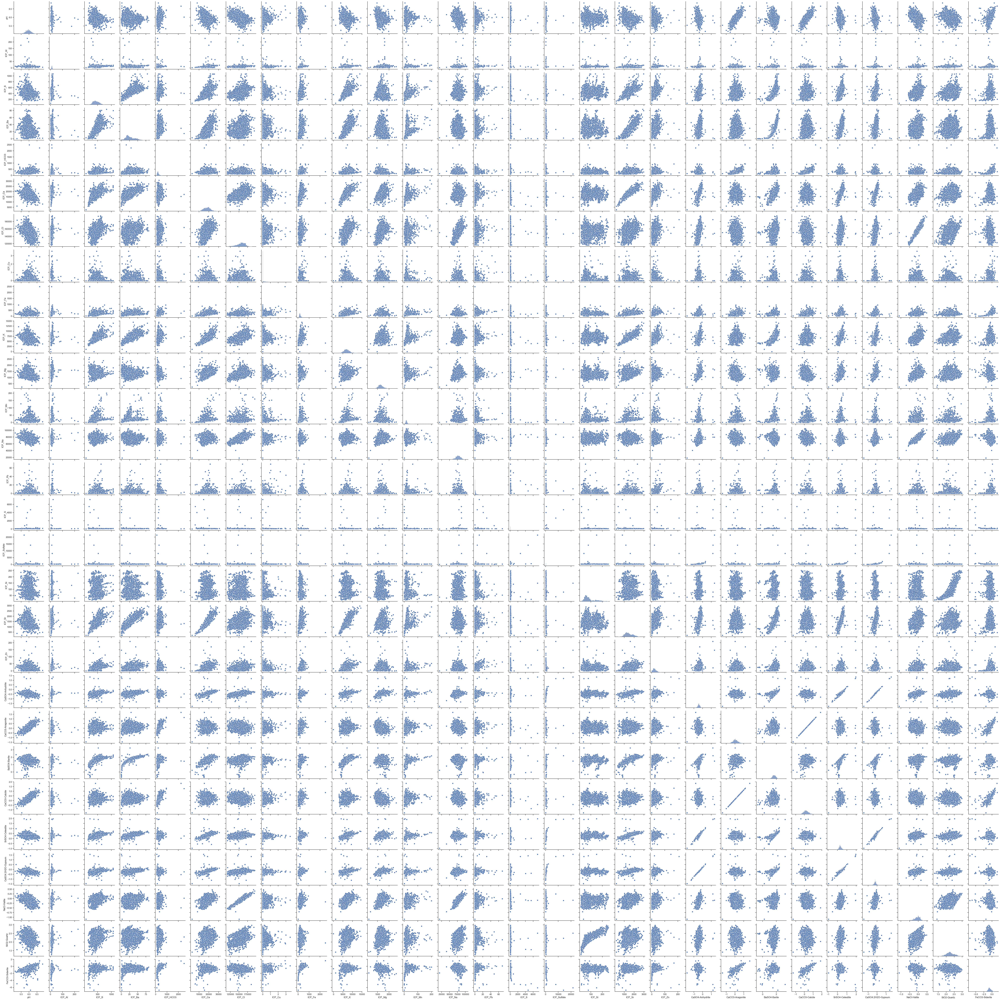

In [9]:
sns.set(style="ticks")
sns.pairplot(df)
plt.show()

### **2.4. Outlier Detection**

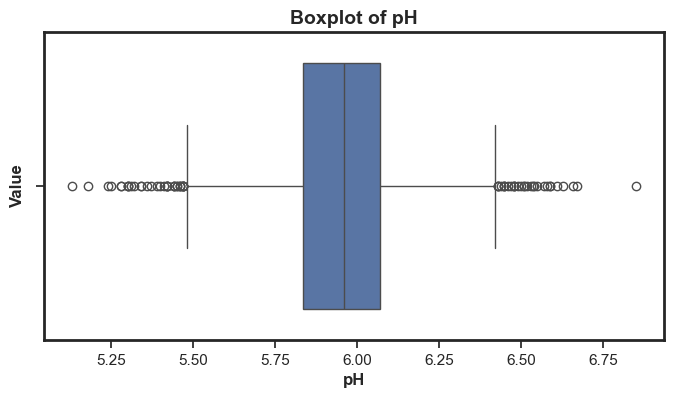

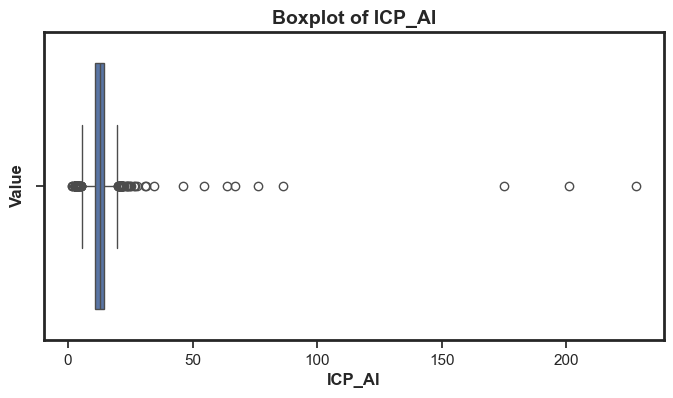

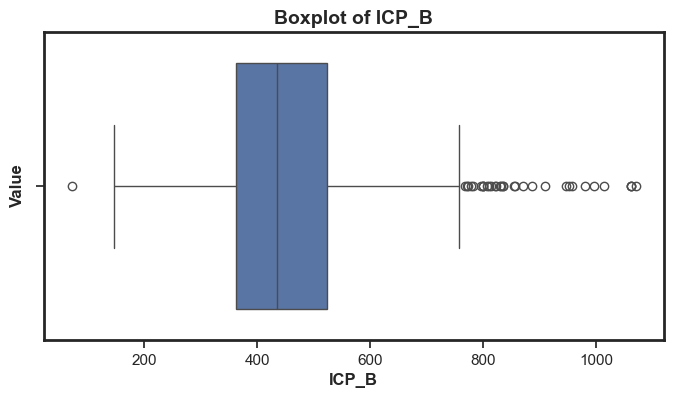

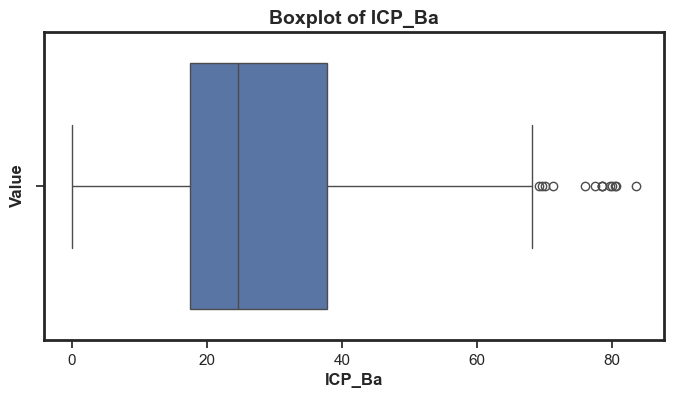

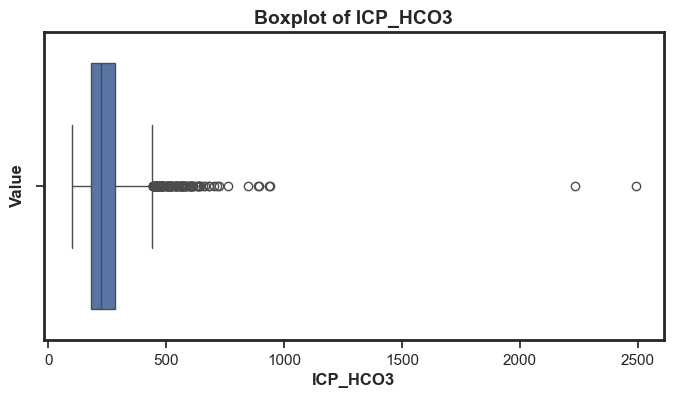

...

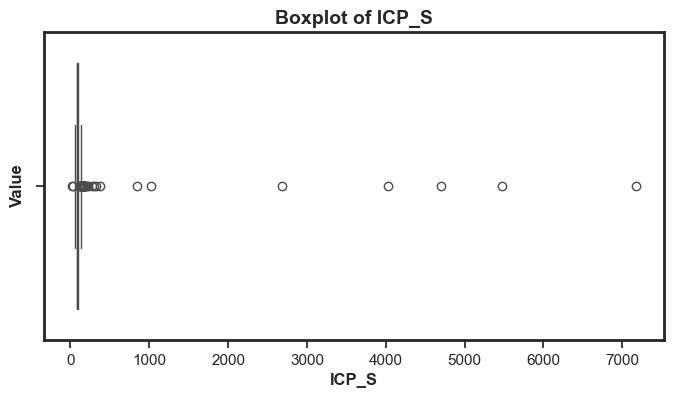

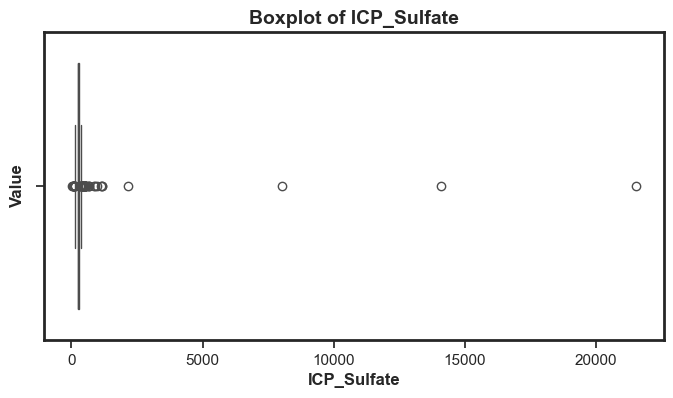

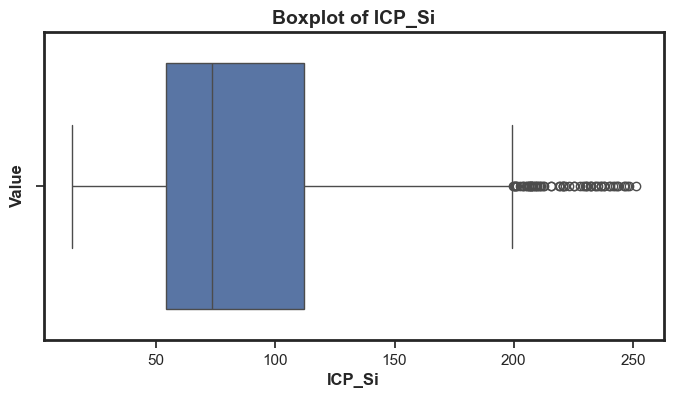

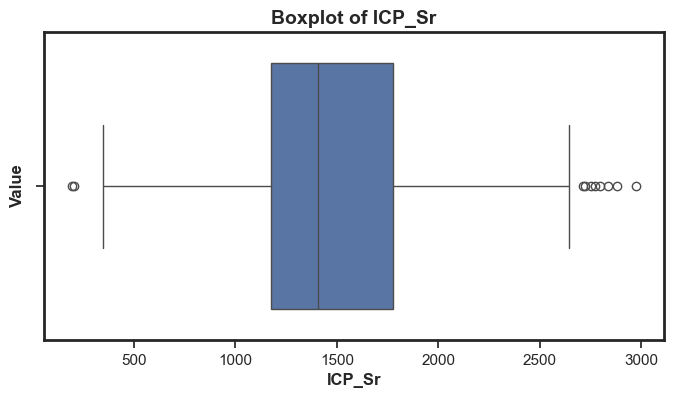

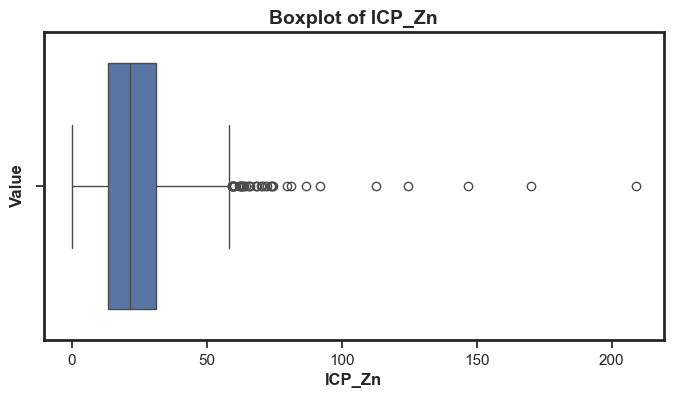

In [10]:
# outlier check using boxplots
for col in X.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12, fontweight='bold')
    plt.ylabel('Value', fontsize=12, fontweight='bold')
    plt.grid(False)
    plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
    plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
    plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
    plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame
    plt.show()

### **2.5. Distribution of Data**

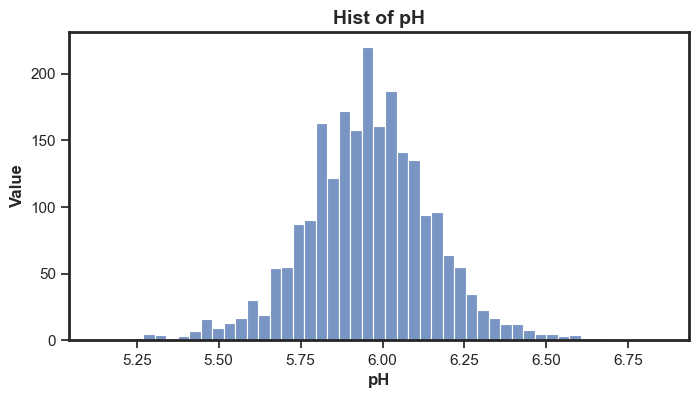

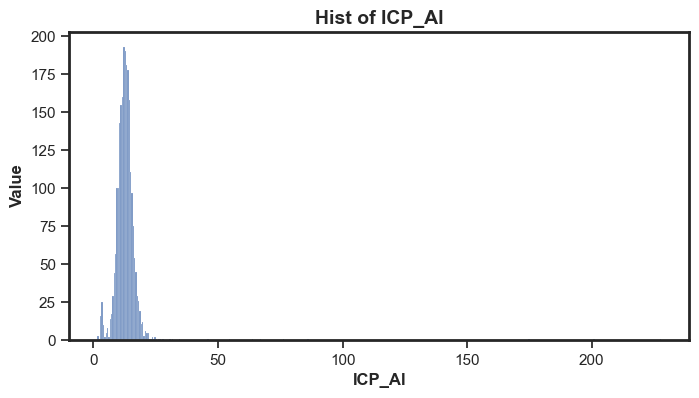

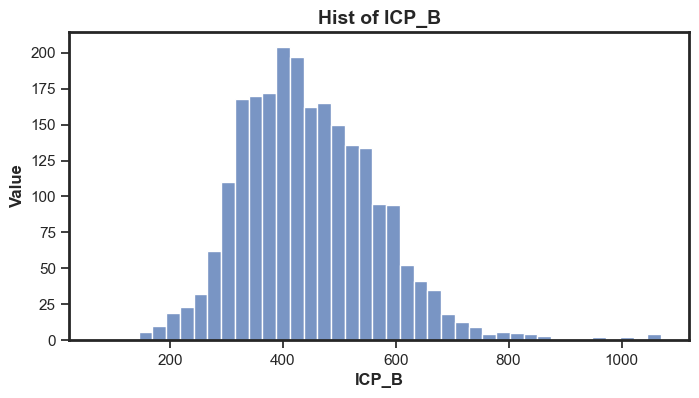

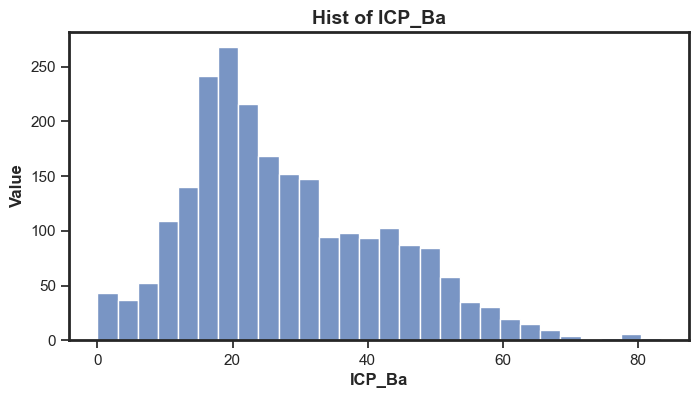

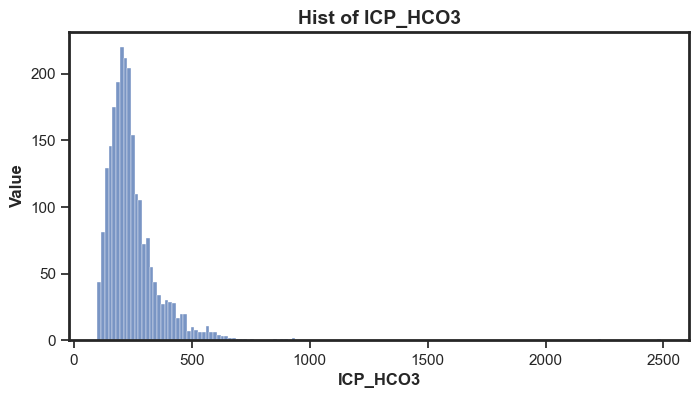

...

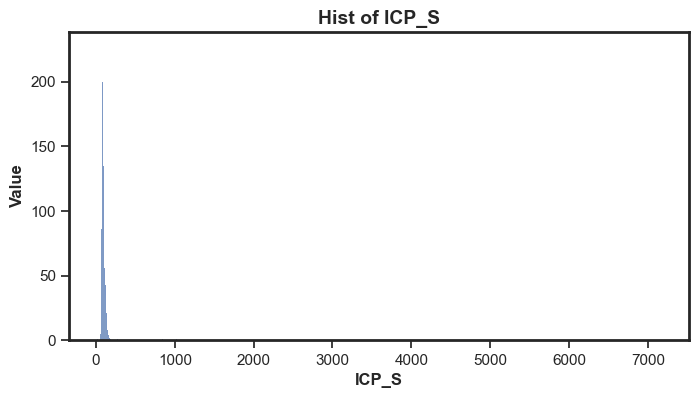

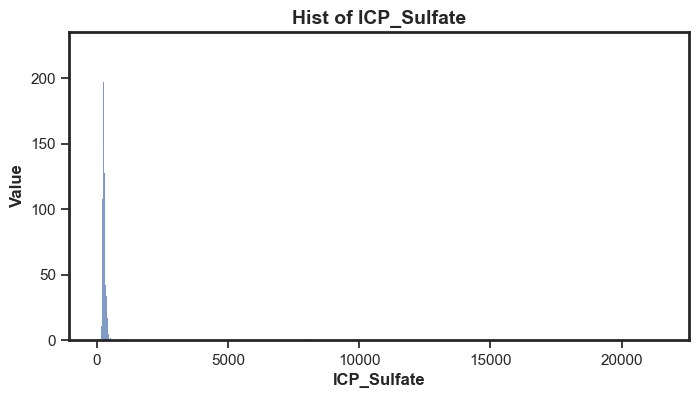

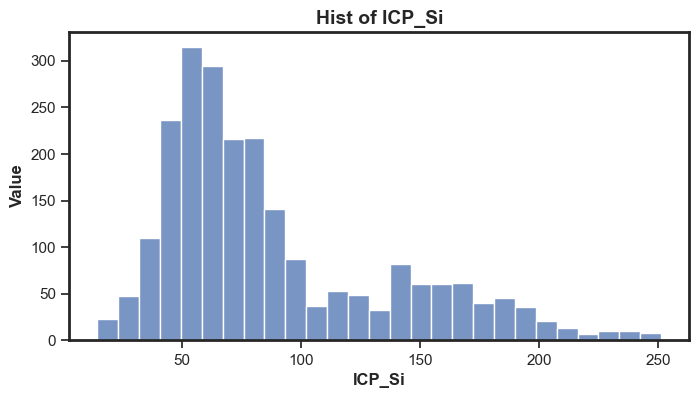

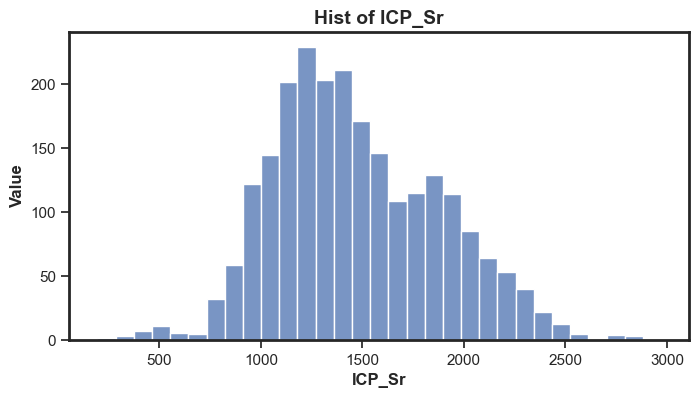

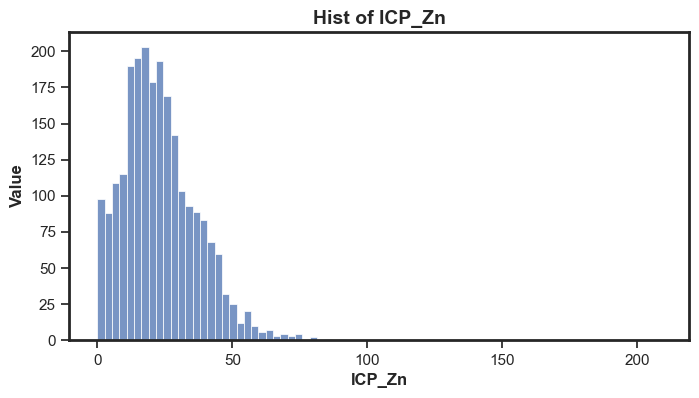

In [11]:
# Plot the histogram every column
for col in X.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(x = df[col])
    plt.title(f'Hist of {col}', fontsize=14, fontweight='bold')
    plt.xlabel(col, fontsize=12, fontweight='bold')
    plt.ylabel('Value', fontsize=12, fontweight='bold')
    plt.grid(False)
    plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
    plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
    plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
    plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame
    plt.show()

# **3. Train Individual Models With Hyperparameters Tuning**
```python

### **3.1. Define Models and Hyperparameters Tuning**

In [12]:
Y = df.iloc[:,19:28]
Y

,CaSO4-Anhydrite,CaCO3-Aragonite,BaSO4-Barite,CaCO3-Calcite,SrSO4-Celestite,CaSO4:2H2O-Gypsum,NaCl-Halite,SiO2-Quartz,FeCO3-Siderite
0,-0.37,0.38,1.66,0.52,0.31,-0.16,0.05,2.15,-0.37
1,-0.46,0.69,1.91,0.83,0.37,-0.24,-0.05,2.12,0.11
2,-0.48,0.65,1.91,0.79,0.44,-0.22,-0.31,2.05,0.31
3,-0.35,0.15,1.99,0.29,0.48,-0.11,-0.20,2.20,-0.66
4,-0.32,0.24,2.06,0.38,0.55,-0.08,-0.20,2.47,-0.44
...,...,...,...,...,...,...,...,...,...
2307,-0.28,-0.14,1.62,0.00,0.35,-0.08,0.12,2.31,-0.94
2308,-0.65,0.82,0.60,0.96,0.02,-0.39,-0.28,1.77,0.65
2309,-0.51,-0.18,0.80,-0.04,0.09,-0.29,-0.04,1.97,-2.30
2310,-0.56,-0.37,1.43,-0.22,0.20,-0.32,-0.17,1.88,-1.81


In [13]:
X = df.iloc[:,0:19]
X

,pH,ICP_Al,ICP_B,ICP_Ba,ICP_HCO3,ICP_Ca,ICP_Cl,ICP_Cu,ICP_Fe,ICP_K,ICP_Mg,ICP_Mn,ICP_Na,ICP_Pb,ICP_S,ICP_Sulfate,ICP_Si,ICP_Sr,ICP_Zn
0,6.14,9.385,391.6,17.500,337.233,14970,167428,0.000,204.30,6605,1727.0,13.380,83500,5.745,116.90,350.70,54.21,1089.0,14.850
1,6.24,12.410,510.5,48.130,475.290,18980,154541,0.174,274.00,7847,1315.0,45.840,78390,2.316,79.43,238.29,56.77,1918.0,16.010
2,6.21,4.361,503.2,48.780,518.180,19240,135505,1.125,328.10,7221,1326.0,54.120,65570,3.568,87.84,263.52,67.24,2132.0,18.160
3,6.01,13.150,480.2,46.570,235.950,19890,143779,0.848,162.00,7845,1094.0,18.210,70930,0.000,105.60,316.80,82.03,1866.0,36.820
4,6.07,14.690,478.2,52.260,250.630,20300,147964,0.000,207.20,7763,1130.0,18.920,67630,2.713,108.40,325.20,150.70,2122.0,41.170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2307,5.95,12.890,487.2,17.710,133.800,19990,169050,0.032,231.50,7775,1518.0,13.880,84800,8.362,101.60,304.80,66.72,1367.0,35.570
2308,6.85,5.782,196.5,1.451,241.870,8072,137185,0.418,259.30,3787,949.1,5.650,77440,0.767,139.90,419.70,40.34,483.6,3.175
2309,6.08,6.847,246.9,2.071,126.130,9530,159683,0.316,50.23,4546,1211.0,2.868,86000,0.000,141.10,423.30,44.24,539.0,1.437
2310,5.91,14.110,413.1,15.730,104.311,15050,144237,0.000,59.54,5880,1236.0,9.239,78000,0.000,87.43,262.29,40.29,1188.0,1.749


In [14]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [15]:
#data split
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2,random_state=991)
#test size is 20% and traing size is 80%
#linear regression
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [16]:
# Define models and hyperparameters for tuning

models_config = {
    'RandomForest': {
        'model': RandomForestRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'max_depth': [None, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },

    'GradientBoosting': {
        'model': GradientBoostingRegressor(random_state=42),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 6, 9]
        }
    },

    'XGBoost': {
        'model': XGBRegressor(
            objective='reg:squarederror',
            random_state=42
        ),
        'params': {
            'n_estimators': [100, 200, 300],
            'learning_rate': [0.01, 0.1, 0.2],
            'max_depth': [3, 6, 9]
        }
    }
}

# Train individual models with hyperparameters tuning
trained_models = {}
best_params_all = {}

for model_name, config in models_config.items():
    print(f"\nTraining {model_name} ...")
    multi_model = MultiOutputRegressor(config['model'])

    param_grid = {
        f"estimator__{k}": v for k, v in config['params'].items()
    }

    grid_search = GridSearchCV(
        estimator=multi_model,
        param_grid=param_grid,
        cv=5,
        scoring='neg_mean_squared_error',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, Y_train)

    trained_models[model_name] = grid_search.best_estimator_
    best_params_all[model_name] = grid_search.best_params_

    print("Best parameters:", grid_search.best_params_)
    print("Best CV score (neg MSE):", grid_search.best_score_)


Training RandomForest ...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'estimator__max_depth': None, 'estimator__min_samples_split': 2, 'estimator__n_estimators': 300}
Best CV score (neg MSE): -0.008024011030834265

Training GradientBoosting ...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'estimator__learning_rate': 0.2, 'estimator__max_depth': 3, 'estimator__n_estimators': 300}
Best CV score (neg MSE): -0.004209337694030071

Training XGBoost ...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'estimator__learning_rate': 0.1, 'estimator__max_depth': 3, 'estimator__n_estimators': 300}
Best CV score (neg MSE): -0.0054748395923525095


# **4. Evaluate Models with Cross-Validation and Hyperparameter Tuning**
```python

In [17]:
def evaluate_regression_model(model, X_test, Y_test, model_name):
    """
    Evaluate multi-output regression model
    """
    Y_pred = model.predict(X_test)

    rmse = np.sqrt(mean_squared_error(Y_test, Y_pred))
    mae = mean_absolute_error(Y_test, Y_pred)
    r2 = r2_score(Y_test, Y_pred)

    return {
        'Model': model_name,
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2,
        'Y_pred': Y_pred
    }

In [18]:
results = []
predictions_all = {}

print("\n" + "=" * 80)
print("MODEL PERFORMANCE ON TEST SET (MULTI-OUTPUT REGRESSION)")
print("=" * 80)

for model_name, model in trained_models.items():
    result = evaluate_regression_model(
        model,
        X_test,      
        Y_test,
        model_name
    )

    results.append(result)
    predictions_all[model_name] = result['Y_pred']

    print(f"\n{model_name}:")
    print(f"  RMSE : {result['RMSE']:.4f}")
    print(f"  MAE  : {result['MAE']:.4f}")
    print(f"  R²   : {result['R2']:.4f}")



MODEL PERFORMANCE ON TEST SET (MULTI-OUTPUT REGRESSION)

RandomForest:
  RMSE : 0.0604
  MAE  : 0.0246
  R²   : 0.9434

GradientBoosting:
  RMSE : 0.0412
  MAE  : 0.0181
  R²   : 0.9728

XGBoost:
  RMSE : 0.0477
  MAE  : 0.0177
  R²   : 0.9639


In [19]:
results_df = pd.DataFrame(results)

print("\n" + "=" * 80)
print("PERFORMANCE SUMMARY")
print("=" * 80)

print(
    results_df[['Model', 'RMSE', 'MAE', 'R2']]
    .sort_values('RMSE')
    .to_string(index=False)
)



PERFORMANCE SUMMARY
           Model     RMSE      MAE       R2
GradientBoosting 0.041178 0.018116 0.972773
         XGBoost 0.047665 0.017721 0.963881
    RandomForest 0.060373 0.024625 0.943405


### **4.2. Plot the Actual Value vs Predict Value**

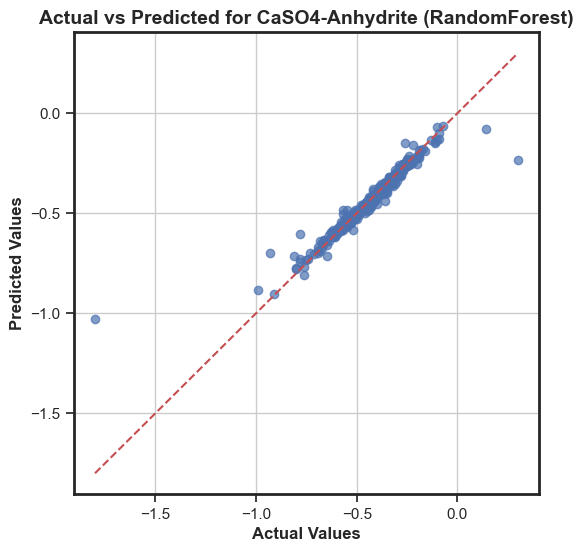

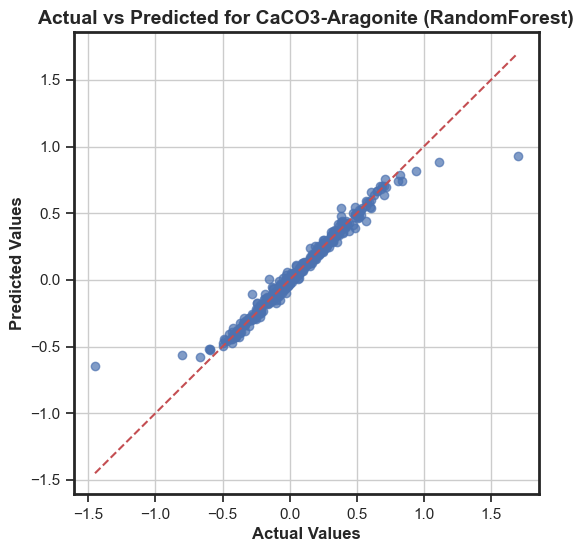

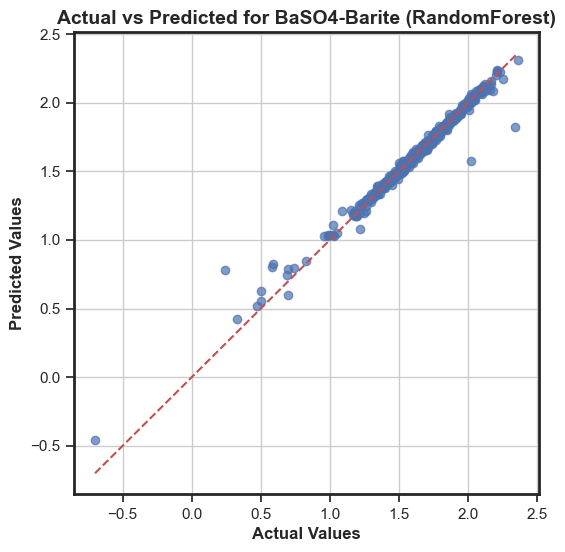

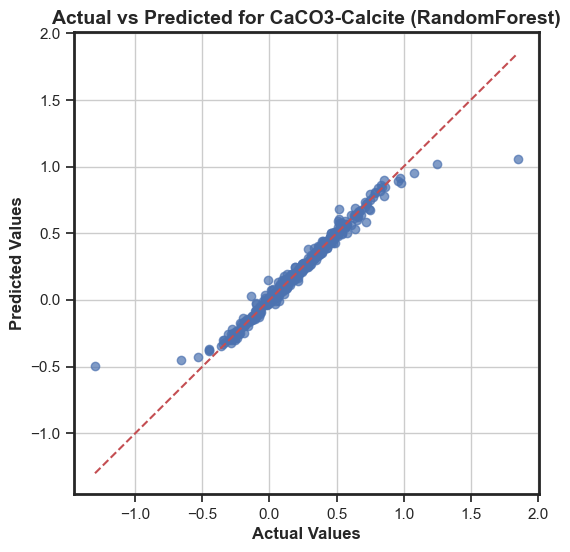

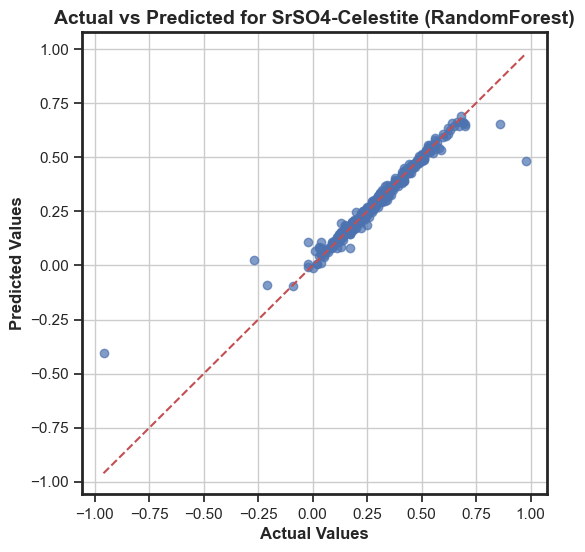

...

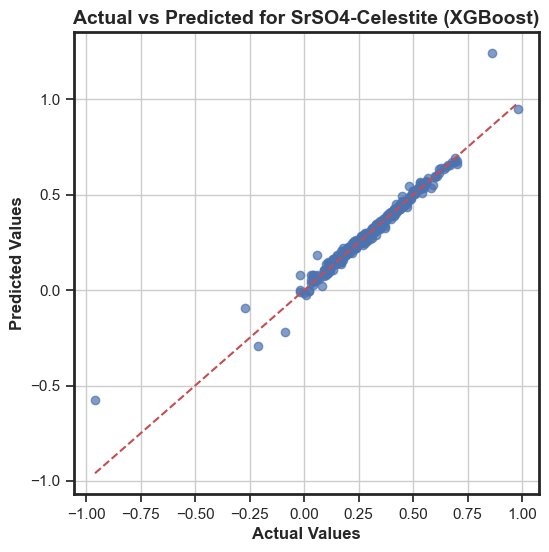

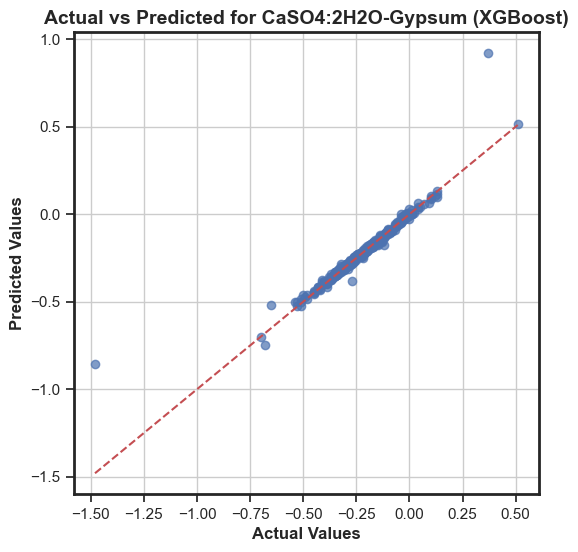

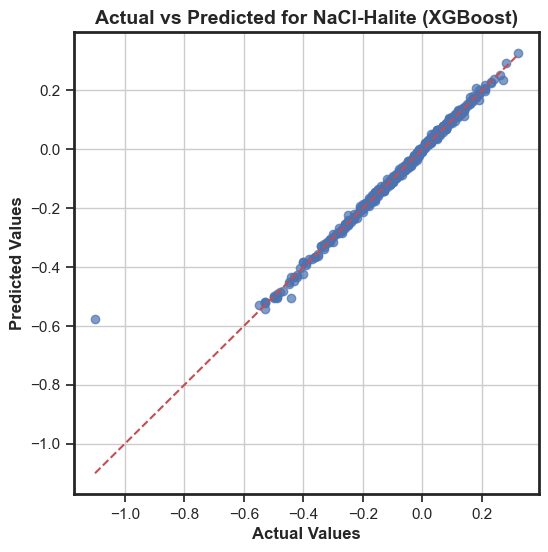

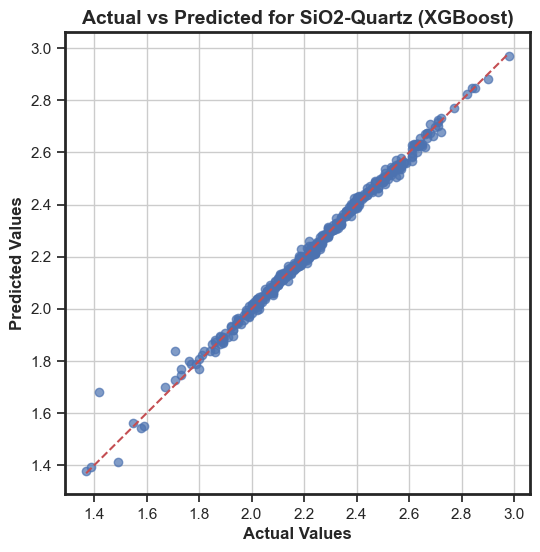

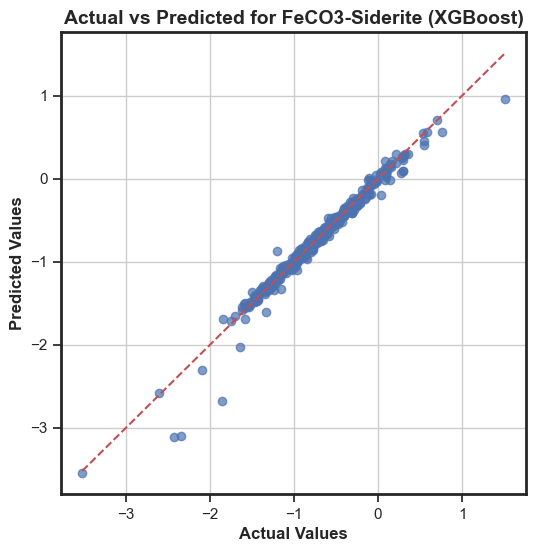

In [20]:
# Plot the Actual Value vs Predict Value
import matplotlib.pyplot as plt

for model_name, Y_pred in predictions_all.items():
    for i, target_col in enumerate(Y.columns):
        plt.figure(figsize=(6, 6))
        plt.scatter(
            Y_test.iloc[:, i],
            Y_pred[:, i],
            alpha=0.7,
            edgecolors='b'
        )
        plt.plot(
            [Y_test.iloc[:, i].min(), Y_test.iloc[:, i].max()],
            [Y_test.iloc[:, i].min(), Y_test.iloc[:, i].max()],
            'r--'
        )
        plt.title(f'Actual vs Predicted for {target_col} ({model_name})',
                  fontsize=14, fontweight='bold')
        plt.xlabel('Actual Values', fontsize=12, fontweight='bold')
        plt.ylabel('Predicted Values', fontsize=12, fontweight='bold')
        plt.grid(True)
        plt.gca().spines['top'].set_linewidth(2)  # Set linewidth for the top frame
        plt.gca().spines['right'].set_linewidth(2)  # Set linewidth for the right frame
        plt.gca().spines['bottom'].set_linewidth(2)  # Set linewidth for the bottom frame
        plt.gca().spines['left'].set_linewidth(2)  # Set linewidth for the left frame
        plt.show()

# **5. SHAP Analysis**
```python

### **5.1. SHAP Analysis for XGBoost Model**


SHAP analysis for Saturation Index: CaSO4-Anhydrite


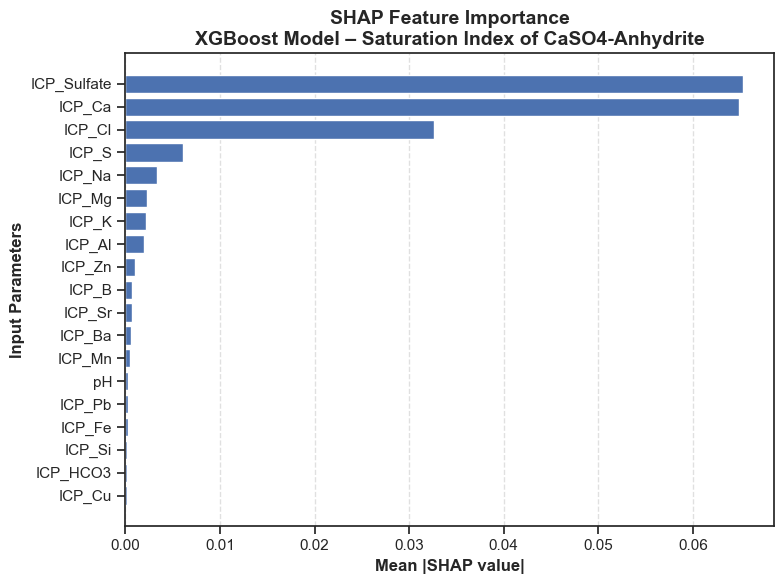


SHAP analysis for Saturation Index: CaCO3-Aragonite


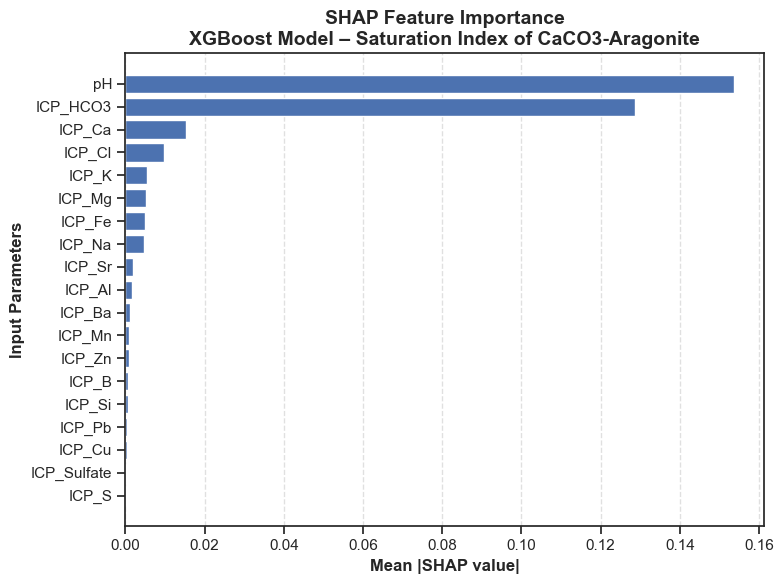


SHAP analysis for Saturation Index: BaSO4-Barite


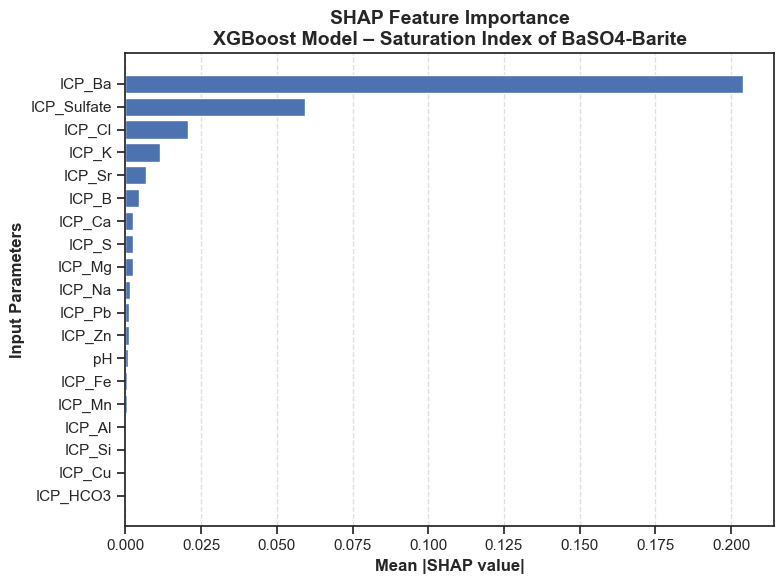


SHAP analysis for Saturation Index: CaCO3-Calcite


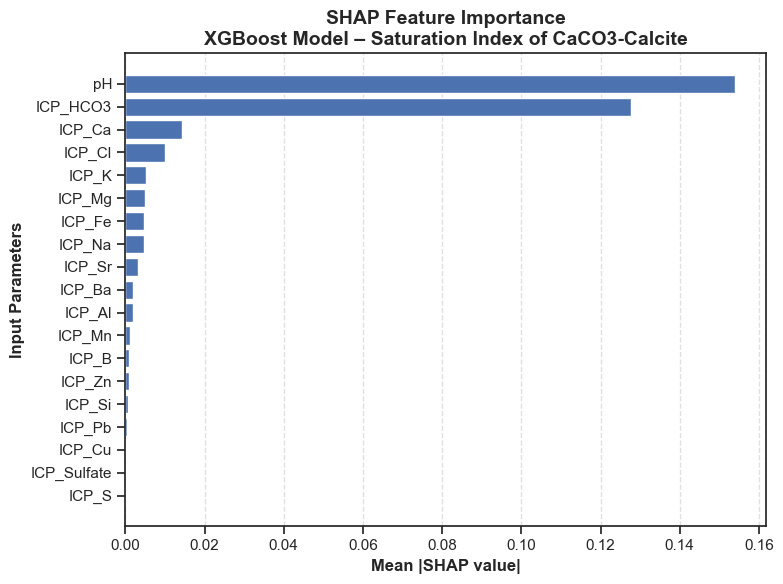


SHAP analysis for Saturation Index: SrSO4-Celestite


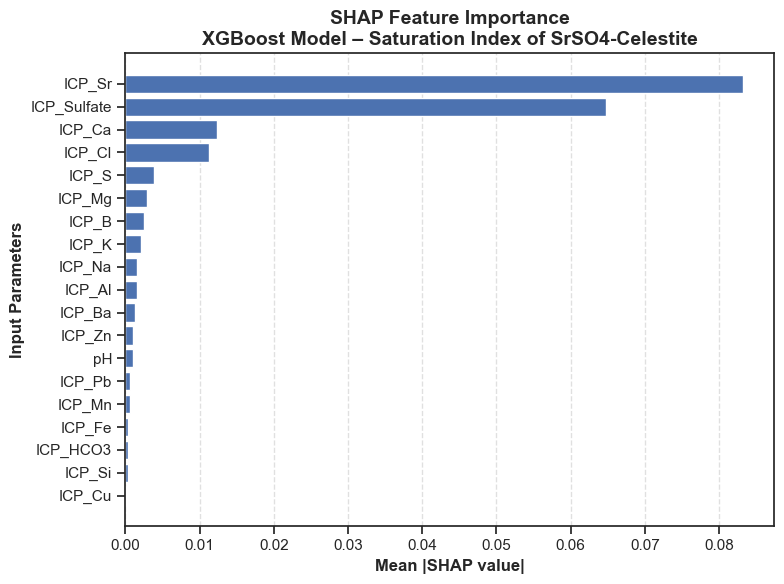


SHAP analysis for Saturation Index: CaSO4:2H2O-Gypsum


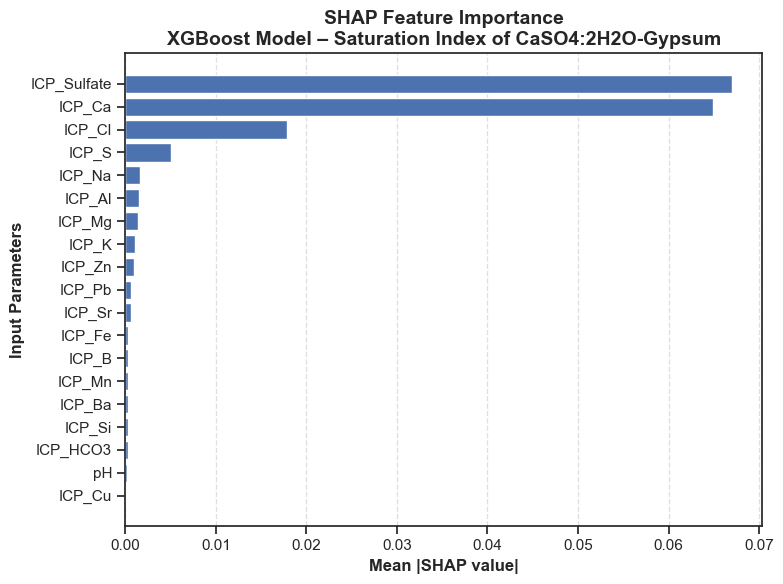


SHAP analysis for Saturation Index: NaCl-Halite


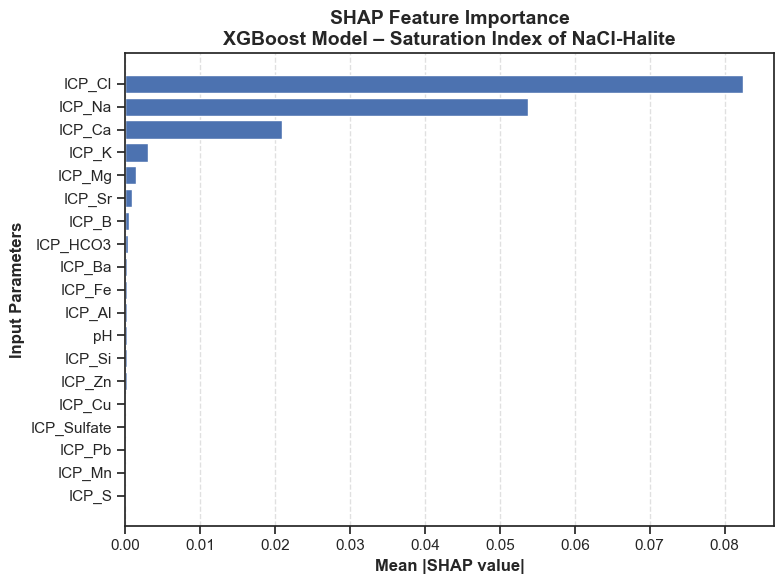


SHAP analysis for Saturation Index: SiO2-Quartz


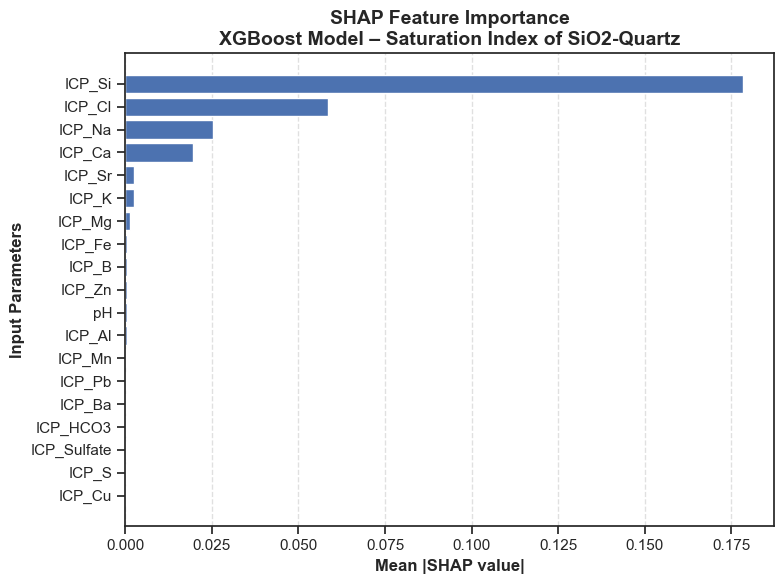


SHAP analysis for Saturation Index: FeCO3-Siderite


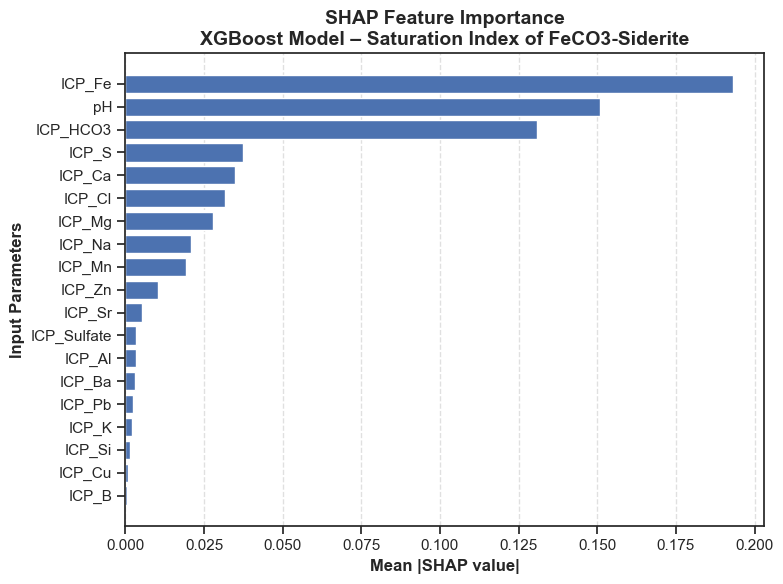

In [21]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# pastikan X_test dan X adalah DataFrame
feature_names = X.columns

for i, target_name in enumerate(Y.columns):

    print(f"\nSHAP analysis for Saturation Index: {target_name}")

    # Ambil model XGBoost untuk target ke-i
    xgb_model = trained_models['XGBoost'].estimators_[i]

    # Gunakan TreeExplainer (WAJIB untuk XGBoost)
    explainer = shap.TreeExplainer(xgb_model)

    shap_values = explainer.shap_values(X_test)

    # Hitung mean absolute SHAP value
    mean_abs_shap = np.mean(np.abs(shap_values), axis=0)

    # Urutkan fitur berdasarkan kontribusi
    sorted_idx = np.argsort(mean_abs_shap)

    plt.figure(figsize=(8, 6))
    plt.barh(
        feature_names[sorted_idx],
        mean_abs_shap[sorted_idx]
    )

    plt.xlabel("Mean |SHAP value|", fontsize=12, fontweight="bold")
    plt.ylabel("Input Parameters", fontsize=12, fontweight="bold")

    plt.title(
        f"SHAP Feature Importance\n"
        f"XGBoost Model – Saturation Index of {target_name}",
        fontsize=14,
        fontweight="bold"
    )

    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


### **5.2. SHAP Analysis for RF Model**


SHAP analysis for Saturation Index: CaSO4-Anhydrite


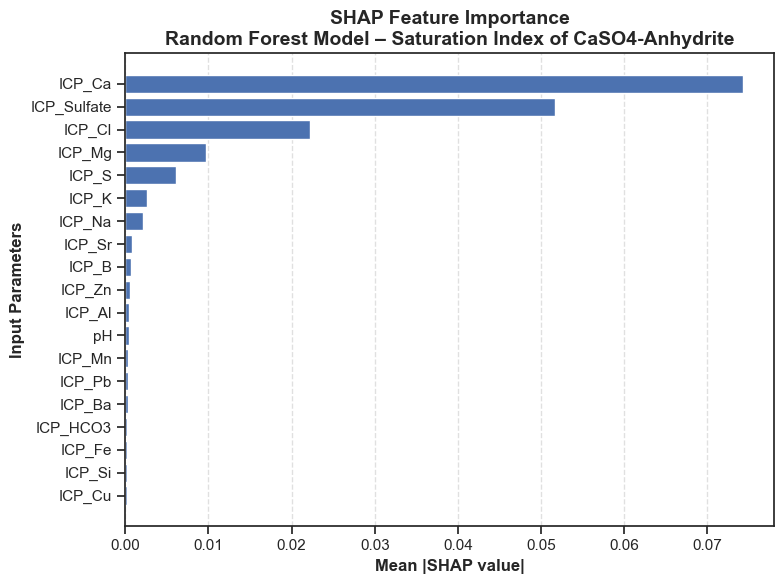


SHAP analysis for Saturation Index: CaCO3-Aragonite


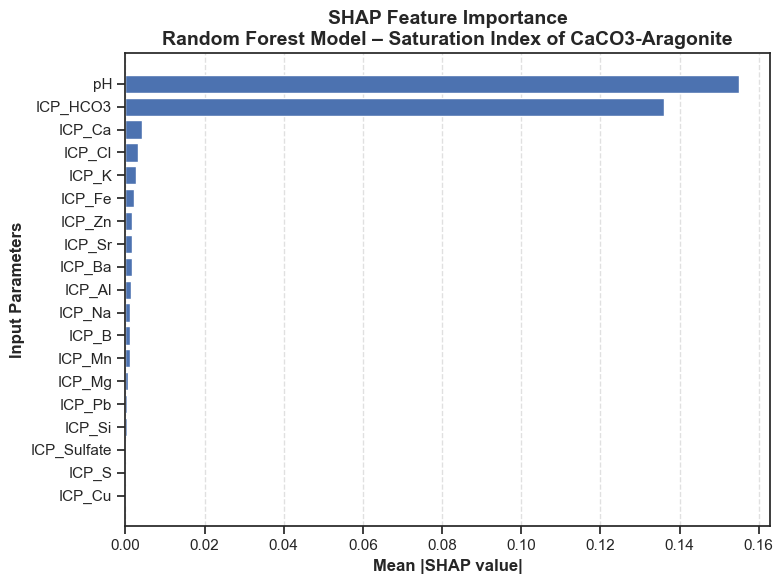


SHAP analysis for Saturation Index: BaSO4-Barite


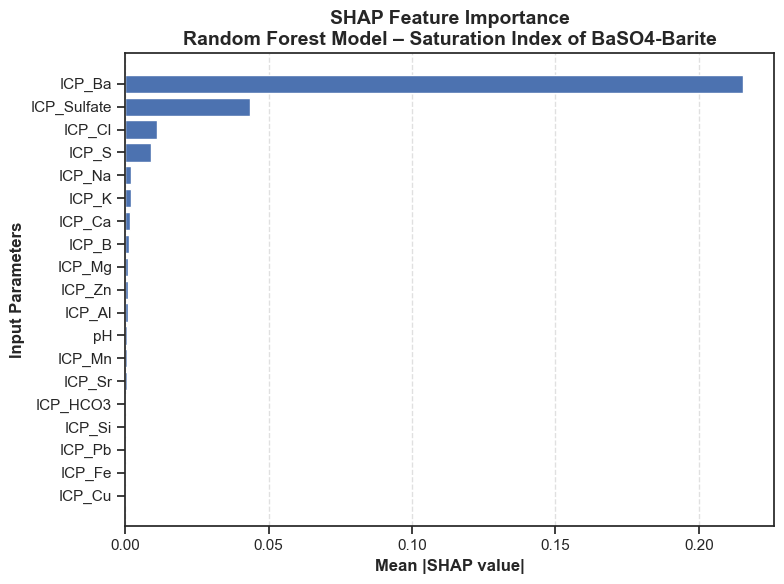


SHAP analysis for Saturation Index: CaCO3-Calcite


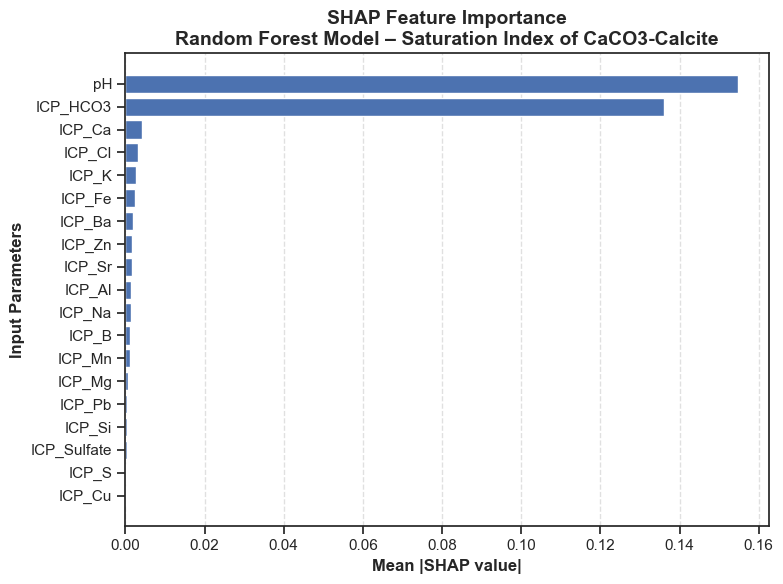


SHAP analysis for Saturation Index: SrSO4-Celestite


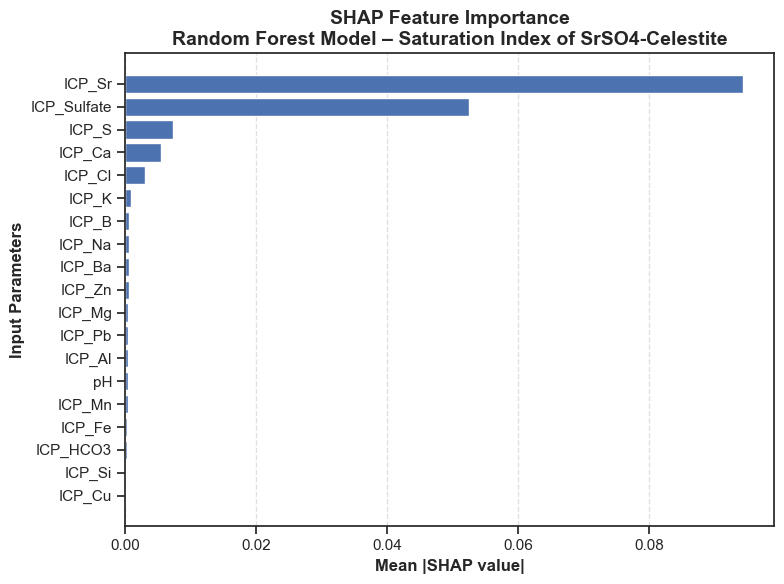


SHAP analysis for Saturation Index: CaSO4:2H2O-Gypsum


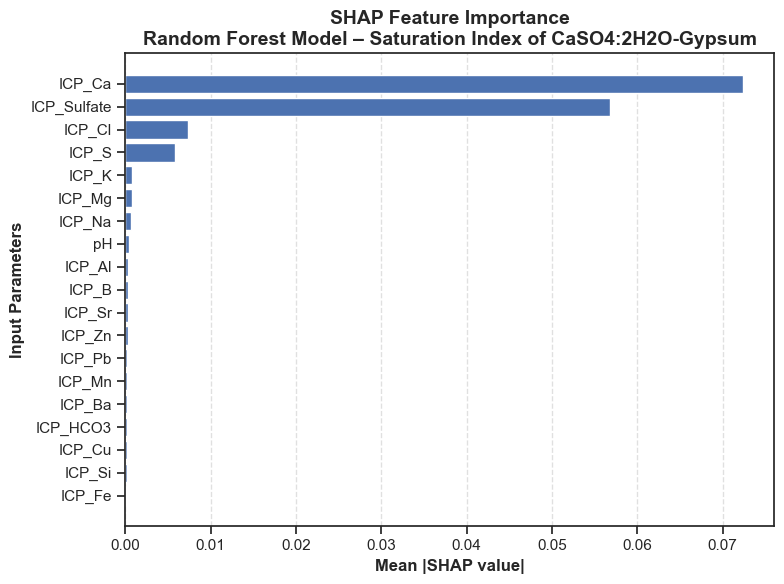


SHAP analysis for Saturation Index: NaCl-Halite


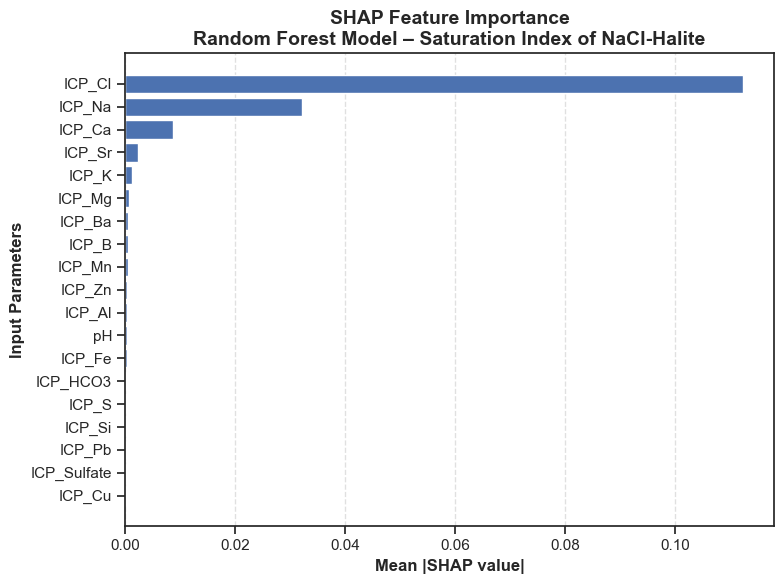


SHAP analysis for Saturation Index: SiO2-Quartz


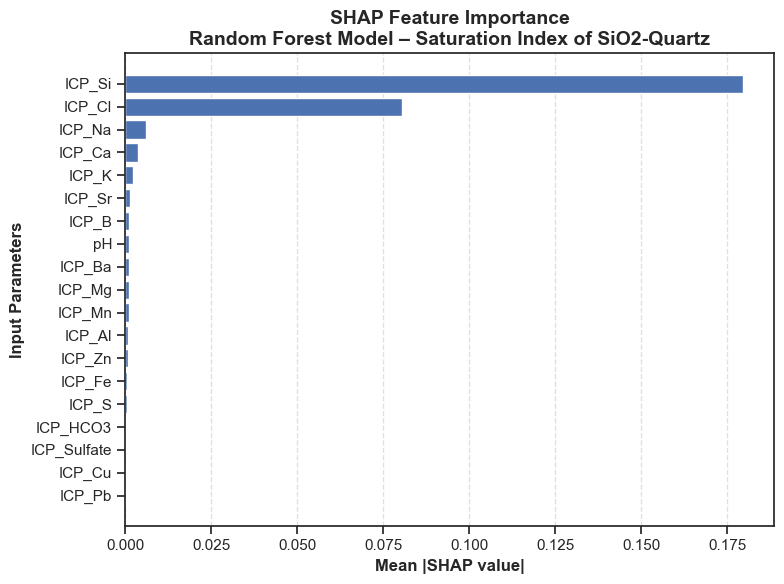


SHAP analysis for Saturation Index: FeCO3-Siderite


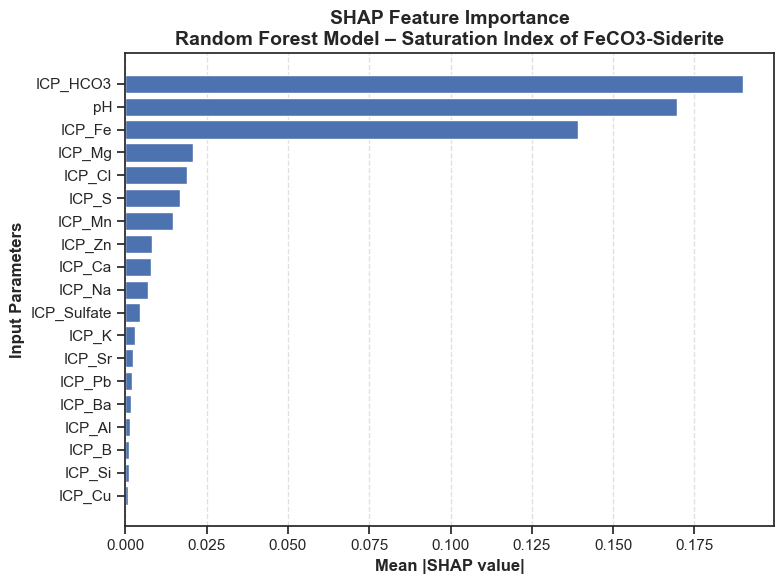

In [22]:
feature_names = X.columns

for i, target_name in enumerate(Y.columns):

    print(f"\nSHAP analysis for Saturation Index: {target_name}")

    # Ambil model Random Forest untuk target ke-i
    rf_model = trained_models['RandomForest'].estimators_[i]

    # Gunakan TreeExplainer (WAJIB untuk Random Forest)
    explainer = shap.TreeExplainer(rf_model)

    shap_values = explainer.shap_values(X_test)

    # Hitung mean absolute SHAP value
    mean_abs_shap = np.mean(np.abs(shap_values), axis=0)

    # Urutkan fitur berdasarkan kontribusi
    sorted_idx = np.argsort(mean_abs_shap)

    plt.figure(figsize=(8, 6))
    plt.barh(
        feature_names[sorted_idx],
        mean_abs_shap[sorted_idx]
    )

    plt.xlabel("Mean |SHAP value|", fontsize=12, fontweight="bold")
    plt.ylabel("Input Parameters", fontsize=12, fontweight="bold")

    plt.title(
        f"SHAP Feature Importance\n"
        f"Random Forest Model – Saturation Index of {target_name}",
        fontsize=14,
        fontweight="bold"
    )

    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

### **5.3. SHAP Analysis for Gradient Boosting Model**


SHAP analysis for Saturation Index: CaSO4-Anhydrite


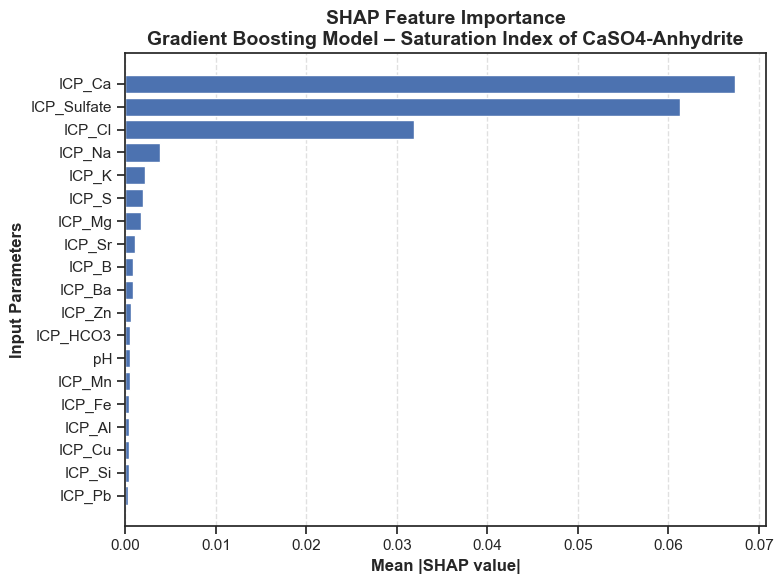


SHAP analysis for Saturation Index: CaCO3-Aragonite


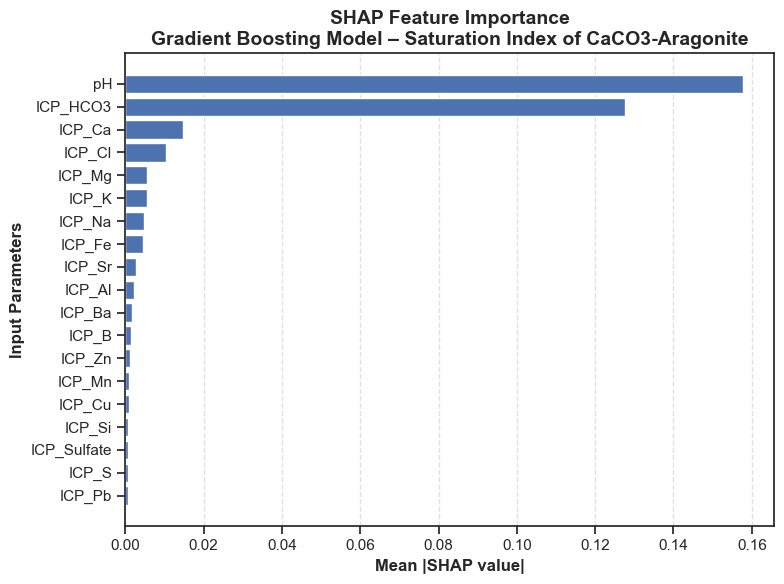


SHAP analysis for Saturation Index: BaSO4-Barite


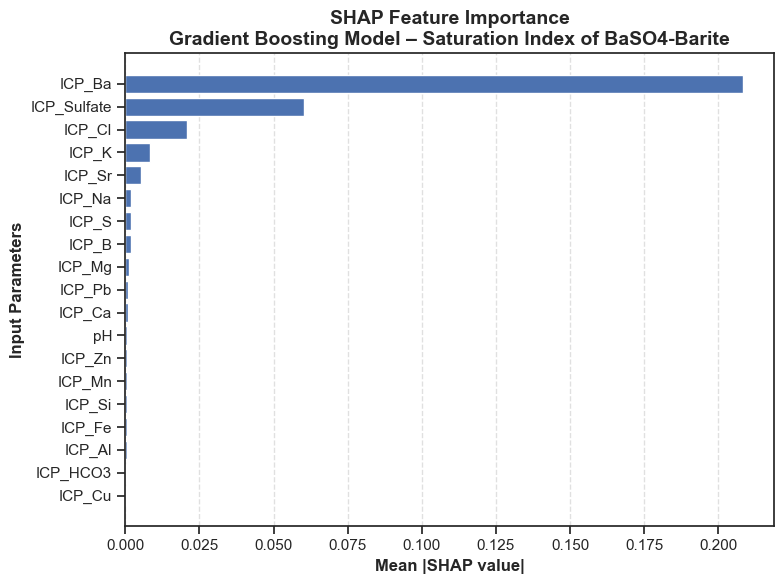


SHAP analysis for Saturation Index: CaCO3-Calcite


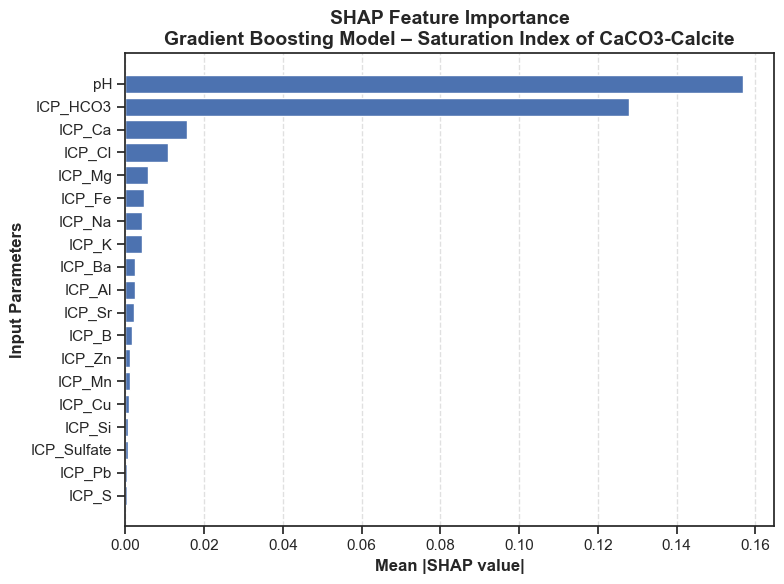


SHAP analysis for Saturation Index: SrSO4-Celestite


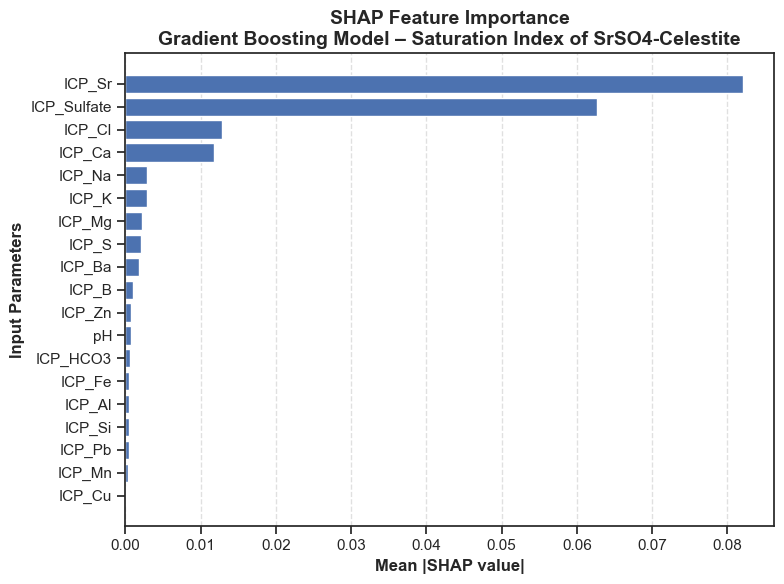


SHAP analysis for Saturation Index: CaSO4:2H2O-Gypsum


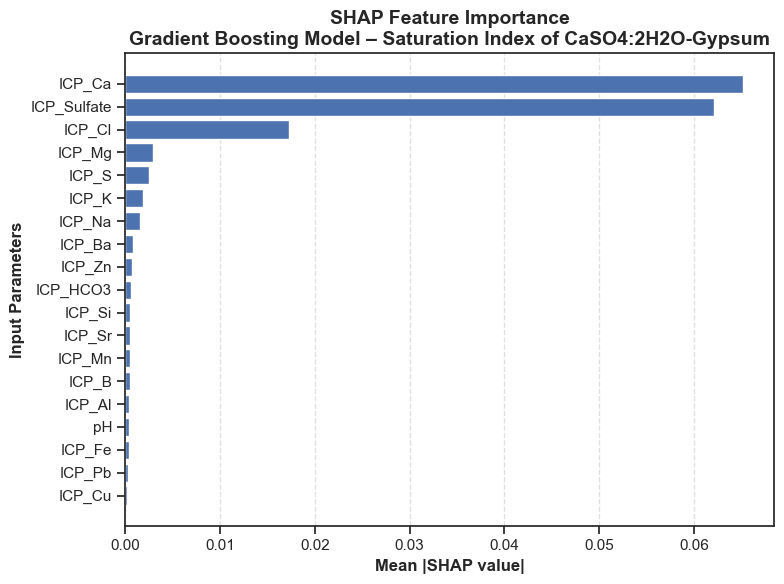


SHAP analysis for Saturation Index: NaCl-Halite


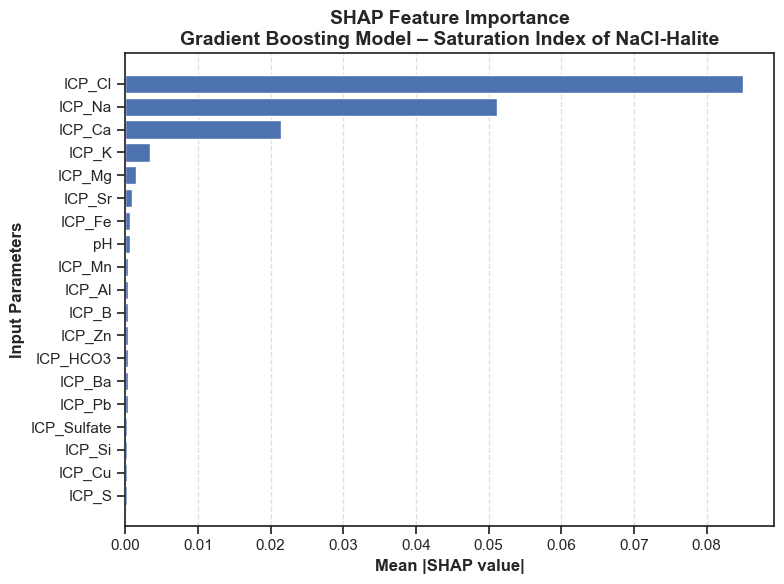


SHAP analysis for Saturation Index: SiO2-Quartz


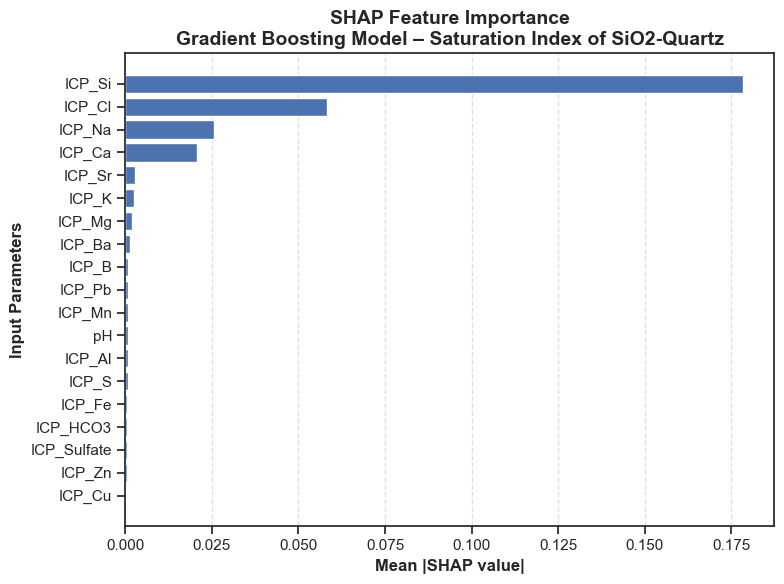


SHAP analysis for Saturation Index: FeCO3-Siderite


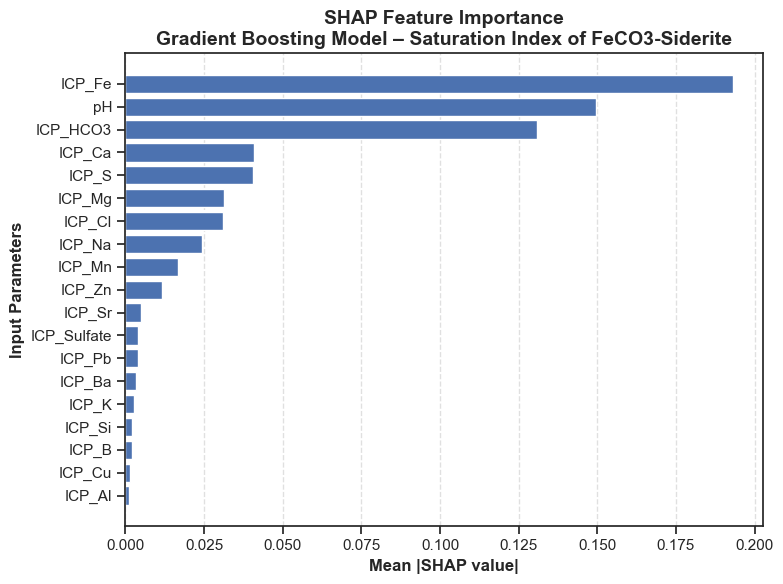

In [23]:
feature_names = X.columns

for i, target_name in enumerate(Y.columns):

    print(f"\nSHAP analysis for Saturation Index: {target_name}")

    # Ambil model Gradient Boosting untuk target ke-i
    gb_model = trained_models['GradientBoosting'].estimators_[i]

    # Gunakan TreeExplainer (WAJIB untuk Gradient Boosting)
    explainer = shap.TreeExplainer(gb_model)

    shap_values = explainer.shap_values(X_test)

    # Hitung mean absolute SHAP value
    mean_abs_shap = np.mean(np.abs(shap_values), axis=0)

    # Urutkan fitur berdasarkan kontribusi
    sorted_idx = np.argsort(mean_abs_shap)

    plt.figure(figsize=(8, 6))
    plt.barh(
        feature_names[sorted_idx],
        mean_abs_shap[sorted_idx]
    )

    plt.xlabel("Mean |SHAP value|", fontsize=12, fontweight="bold")
    plt.ylabel("Input Parameters", fontsize=12, fontweight="bold")

    plt.title(
        f"SHAP Feature Importance\n"
        f"Gradient Boosting Model – Saturation Index of {target_name}",
        fontsize=14,
        fontweight="bold"
    )

    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

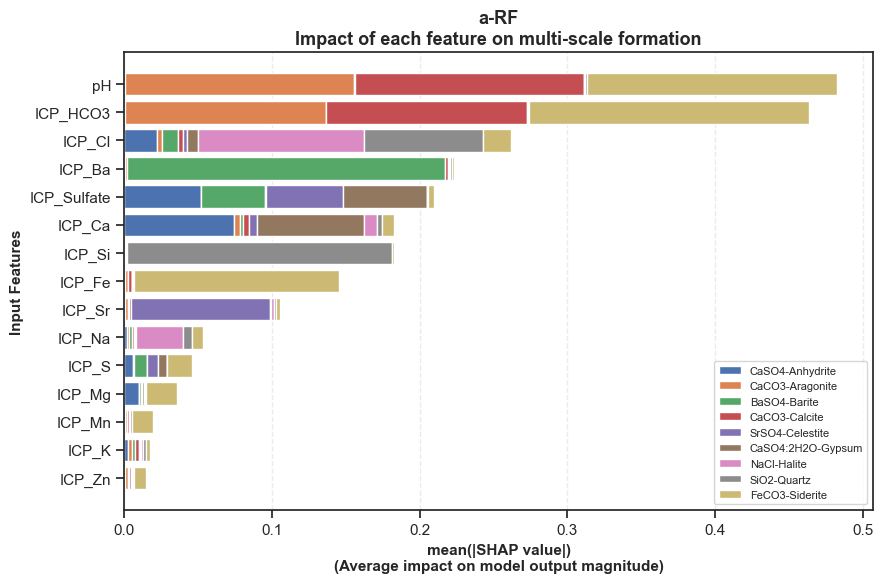

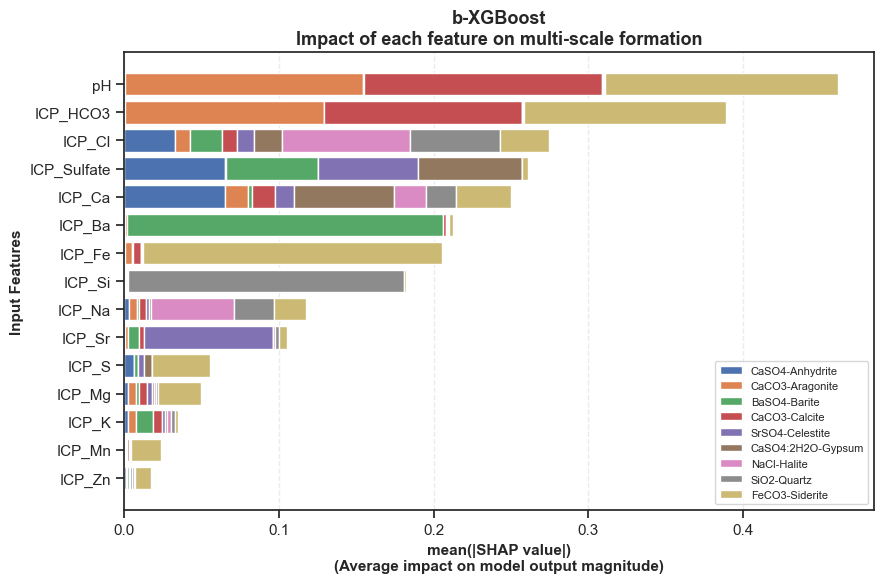

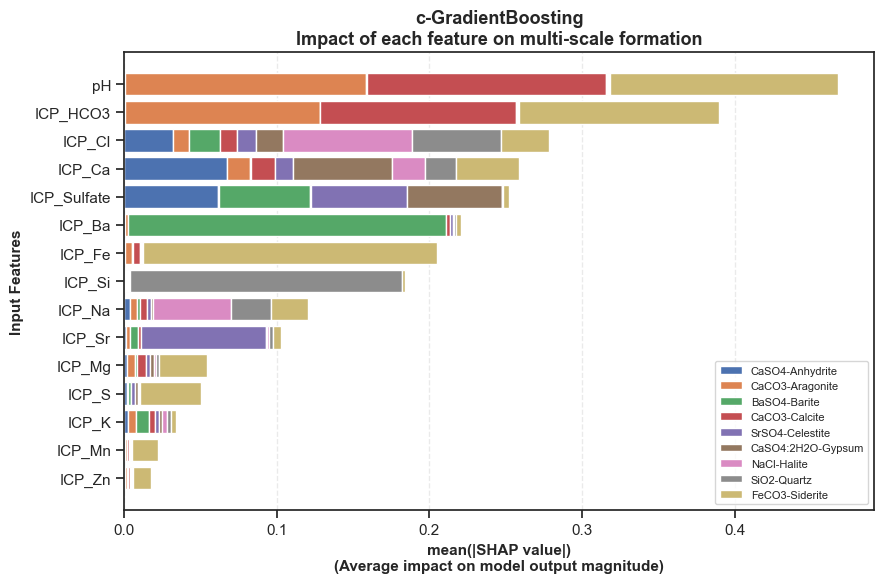

In [24]:
def shap_stacked_barplot(
    trained_model,
    X_test,
    feature_names,
    target_names,
    model_label,
    max_features=15
):
    """
    Create stacked SHAP bar plot for multi-output regression
    """

    shap_matrix = []

    # === Loop per Saturation Index ===
    for i, target in enumerate(target_names):

        base_model = trained_model.estimators_[i]
        explainer = shap.TreeExplainer(base_model)
        shap_values = explainer.shap_values(X_test)

        mean_abs_shap = np.mean(np.abs(shap_values), axis=0)
        shap_matrix.append(mean_abs_shap)

    # shape: (n_targets, n_features)
    shap_matrix = np.array(shap_matrix)

    # total importance per feature
    total_importance = shap_matrix.sum(axis=0)

    # ambil top-N fitur
    top_idx = np.argsort(total_importance)[-max_features:]

    shap_df = pd.DataFrame(
        shap_matrix[:, top_idx].T,
        index=feature_names[top_idx],
        columns=target_names
    )

    # === PLOT ===
    plt.figure(figsize=(9, 6))
    left = np.zeros(len(shap_df))

    for target in shap_df.columns:
        plt.barh(
            shap_df.index,
            shap_df[target],
            left=left,
            label=target
        )
        left += shap_df[target].values

    plt.xlabel("mean(|SHAP value|)\n(Average impact on model output magnitude)",
               fontsize=11, fontweight="bold")
    plt.ylabel("Input Features", fontsize=11, fontweight="bold")

    plt.title(
        f"{model_label}\nImpact of each feature on multi-scale formation",
        fontsize=13,
        fontweight="bold"
    )

    plt.legend(
        loc="lower right",
        fontsize=8,
        frameon=True
    )

    plt.grid(axis="x", linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

feature_names = X.columns.values
target_names = Y.columns.values

# Random Forest
shap_stacked_barplot(
    trained_models['RandomForest'],
    X_test,
    feature_names,
    target_names,
    model_label="a-RF",
    max_features=15
)

# XGBoost
shap_stacked_barplot(
    trained_models['XGBoost'],
    X_test,
    feature_names,
    target_names,
    model_label="b-XGBoost",
    max_features=15
)

# Gradient Boosting (opsional)
shap_stacked_barplot(
    trained_models['GradientBoosting'],
    X_test,
    feature_names,
    target_names,
    model_label="c-GradientBoosting",
    max_features=15
)


# **6. POWER ENSEMBLE LEARNING (PLEM) - Menggabungkan Prediksi Multiple Models**
Teknik ensemble learning menggabungkan prediksi dari beberapa model untuk hasil yang lebih akurat dan robust

### **6.1 Simple Averaging & Weighted Averaging Ensemble**

In [ ]:
# # Take all predictions from base models
# rf_pred = predictions_all['RandomForest']
# xgb_pred = predictions_all['XGBoost']
# gb_pred = predictions_all['GradientBoosting']

# # Simple averaging
# ensemble_avg_pred = (rf_pred + xgb_pred + gb_pred) / 3

# # Evaluate simple averaging
# rmse_avg = np.sqrt(mean_squared_error(Y_test, ensemble_avg_pred))
# mae_avg = mean_absolute_error(Y_test, ensemble_avg_pred)
# r2_avg = r2_score(Y_test, ensemble_avg_pred)

# print("\n" + "=" * 80)
# print("ENSEMBLE AVERAGING PERFORMANCE")
# print("=" * 80)
# print(f"RMSE : {rmse_avg:.4f}")
# print(f"MAE  : {mae_avg:.4f}")
# print(f"R²   : {r2_avg:.4f}")


ENSEMBLE AVERAGING PERFORMANCE
RMSE : 0.0443
MAE  : 0.0166
R²   : 0.9695


In [ ]:
# # Weighted Averaging from R² scores
# r2_rf = results[0]['R2']
# r2_xgb = results[1]['R2']
# r2_gb = results[2]['R2']

# weights = np.array([r2_rf, r2_xgb, r2_gb])
# weights = np.maximum(weights, 0)
# total_weight = weights.sum()

# if total_weight > 0:
#     weights = weights / total_weight
# else:
#     weights = np.array([1/3, 1/3, 1/3])

# print(f"\nWeights berdasarkan R² scores:")
# print(f"  RandomForest: {weights[0]:.4f}")
# print(f"  XGBoost: {weights[1]:.4f}")
# print(f"  GradientBoosting: {weights[2]:.4f}")

# # Weighted averaging
# ensemble_weighted_pred = (
#     weights[0] * rf_pred + 
#     weights[1] * xgb_pred + 
#     weights[2] * gb_pred
# )

# # Evaluate weighted averaging
# rmse_weighted = np.sqrt(mean_squared_error(Y_test, ensemble_weighted_pred))
# mae_weighted = mean_absolute_error(Y_test, ensemble_weighted_pred)
# r2_weighted = r2_score(Y_test, ensemble_weighted_pred)

# print("\n" + "=" * 80)
# print("ENSEMBLE WEIGHTED AVERAGING PERFORMANCE")
# print("=" * 80)
# print(f"RMSE : {rmse_weighted:.4f}")
# print(f"MAE  : {mae_weighted:.4f}")
# print(f"R²   : {r2_weighted:.4f}")


Weights berdasarkan R² scores:
  RandomForest: 0.3276
  XGBoost: 0.3378
  GradientBoosting: 0.3347

ENSEMBLE WEIGHTED AVERAGING PERFORMANCE
RMSE : 0.0442
MAE  : 0.0166
R²   : 0.9696


### **6.2. PLEM**

In [39]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

base_models = [
    trained_models['RandomForest'],
    trained_models['XGBoost'],
    trained_models['GradientBoosting']
]

n_models  = len(base_models)
n_outputs = Y_train.shape[1]

kf = KFold(n_splits=5, shuffle=True, random_state=42)

meta_X_train = np.zeros((X_train.shape[0], n_models * n_outputs))
meta_X_test  = np.zeros((X_test.shape[0],  n_models * n_outputs))

for i, model in enumerate(base_models):
    oof_pred = np.zeros((X_train.shape[0], n_outputs))

    for train_idx, val_idx in kf.split(X_train):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        Y_tr = Y_train.iloc[train_idx]

        model.fit(X_tr, Y_tr)
        oof_pred[val_idx] = model.predict(X_val)

    meta_X_train[:, i*n_outputs:(i+1)*n_outputs] = oof_pred
    meta_X_test[:,  i*n_outputs:(i+1)*n_outputs] = model.predict(X_test)

meta_model = Ridge(alpha=1.0)
meta_model.fit(meta_X_train, Y_train)

Y_pred_plem = meta_model.predict(meta_X_test)

rmse_PLEM = np.sqrt(mean_squared_error(Y_test, Y_pred_plem))
mae_PLEM = mean_absolute_error(Y_test, Y_pred_plem)
r2_PLEM = r2_score(Y_test, Y_pred_plem)

print("\n" + "=" * 80)
print("ENSEMBLE WEIGHTED AVERAGING PERFORMANCE")
print("=" * 80)
print(f"RMSE : {rmse_PLEM:.4f}")
print(f"MAE  : {mae_PLEM:.4f}")
print(f"R²   : {r2_PLEM:.4f}")

# for i, col in enumerate(Y_test.columns):
#     r2_PLEM = r2_score(Y_test.iloc[:, i], Y_pred_plem[:, i])
#     mae_PLEM = mean_absolute_error(Y_test.iloc[:, i], Y_pred_plem[:, i])
#     rmse_PLEM = np.sqrt(mean_squared_error(
#         Y_test.iloc[:, i], Y_pred_plem[:, i]))

#     print(f"\nTarget: {col}")
#     print(f"  R²   : {r2_PLEM:.4f}")
#     print(f"  MAE  : {mae_PLEM:.4f}")
#     print(f"  RMSE : {rmse_PLEM:.4f}")


ENSEMBLE WEIGHTED AVERAGING PERFORMANCE
RMSE : 0.0424
MAE  : 0.0193
R²   : 0.9712


### **6.3 Perbandingan Performa Semua Model**

In [47]:
# Buat dataframe perbandingan
results_ensemble = results + [
    # {
    #     'Model': 'Ensemble-Averaging',
    #     'RMSE': rmse_avg,
    #     'MAE': mae_avg,
    #     'R2': r2_avg,
    #     'Y_pred': ensemble_avg_pred
    # },
    # {
    #     'Model': 'Ensemble-Weighted',
    #     'RMSE': rmse_weighted,
    #     'MAE': mae_weighted,
    #     'R2': r2_weighted,
    #     'Y_pred': ensemble_weighted_pred
    # },
    {
        'Model': 'PLEM',
        'RMSE': rmse_PLEM,
        'MAE': mae_PLEM,
        'R2': r2_PLEM,
        'Y_pred': Y_pred_plem
    }
]

comparison_df = pd.DataFrame(results_ensemble)

print("\n" + "=" * 100)
print("FINAL SUMMARY: INDIVIDUAL MODELS vs ENSEMBLE METHODS")
print("=" * 100)

summary_table = comparison_df[['Model', 'RMSE', 'MAE', 'R2']].copy()
print(summary_table.sort_values('RMSE').to_string(index=False))

# Identifikasi best model
best_rmse_idx = comparison_df['RMSE'].idxmin()
best_r2_idx = comparison_df['R2'].idxmax()

print("\n" + "=" * 100)
print(f"Best Model (RMSE): {comparison_df.loc[best_rmse_idx, 'Model']} "
      f"(RMSE = {comparison_df.loc[best_rmse_idx, 'RMSE']:.6f})")
print(f"Best Model (R²): {comparison_df.loc[best_r2_idx, 'Model']} "
      f"(R² = {comparison_df.loc[best_r2_idx, 'R2']:.6f})")
print("=" * 100)


FINAL SUMMARY: INDIVIDUAL MODELS vs ENSEMBLE METHODS
           Model     RMSE      MAE       R2
GradientBoosting 0.041178 0.018116 0.972773
            PLEM 0.042409 0.019255 0.971227
         XGBoost 0.047665 0.017721 0.963881
    RandomForest 0.060373 0.024625 0.943405

Best Model (RMSE): GradientBoosting (RMSE = 0.041178)
Best Model (R²): GradientBoosting (R² = 0.972773)


### **6.4 Visualisasi Perbandingan Performa**

<Figure size 800x600 with 0 Axes>

<Figure size 700x500 with 0 Axes>

<Figure size 700x500 with 0 Axes>

<Figure size 600x400 with 0 Axes>

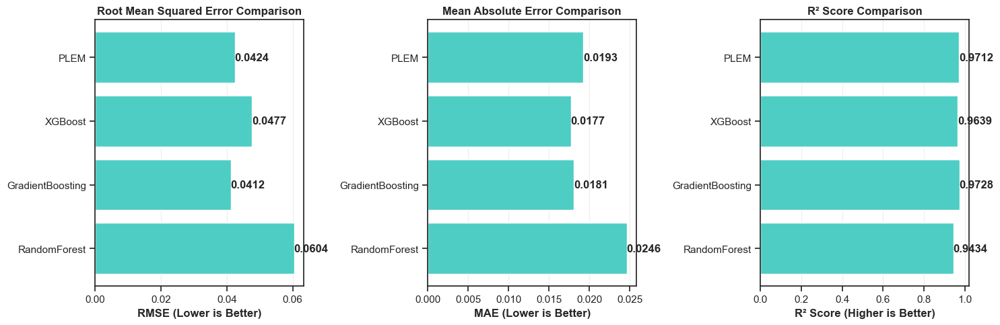

In [48]:
# Plot perbandingan RMSE, MAE, R2
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# RMSE
colors = ['#FF6B6B' if 'Ensemble' in m else '#4ECDC4' 
          for m in comparison_df['Model']]
ax = axes[0]
ax.barh(comparison_df['Model'], comparison_df['RMSE'], color=colors)
ax.set_xlabel('RMSE (Lower is Better)', fontsize=12, fontweight='bold')
ax.set_title('Root Mean Squared Error Comparison', fontsize=12, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, v in enumerate(comparison_df['RMSE']):
    ax.text(v, i, f'{v:.4f}', va='center', ha='left', fontweight='bold')

# MAE
ax = axes[1]
ax.barh(comparison_df['Model'], comparison_df['MAE'], color=colors)
ax.set_xlabel('MAE (Lower is Better)', fontsize=12, fontweight='bold')
ax.set_title('Mean Absolute Error Comparison', fontsize=12, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, v in enumerate(comparison_df['MAE']):
    ax.text(v, i, f'{v:.4f}', va='center', ha='left', fontweight='bold')

# R2
ax = axes[2]
ax.barh(comparison_df['Model'], comparison_df['R2'], color=colors)
ax.set_xlabel('R² Score (Higher is Better)', fontsize=12, fontweight='bold')
ax.set_title('R² Score Comparison', fontsize=12, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, v in enumerate(comparison_df['R2']):
    ax.text(v, i, f'{v:.4f}', va='center', ha='left', fontweight='bold')

plt.tight_layout()
plt.show()

### **6.5 Actual vs Predicted Plot untuk Ensemble Models**

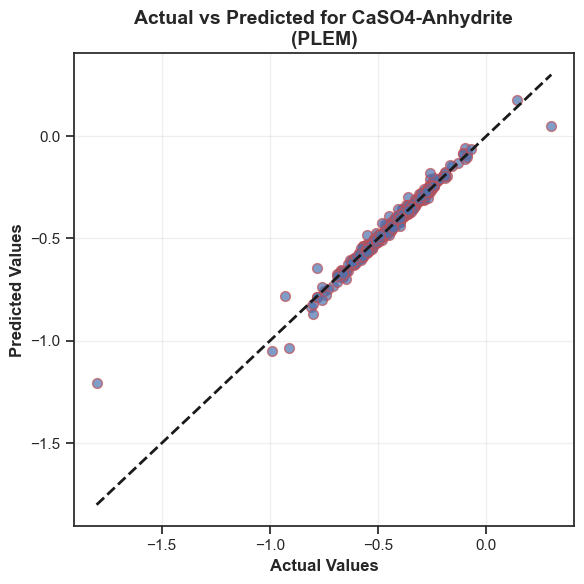

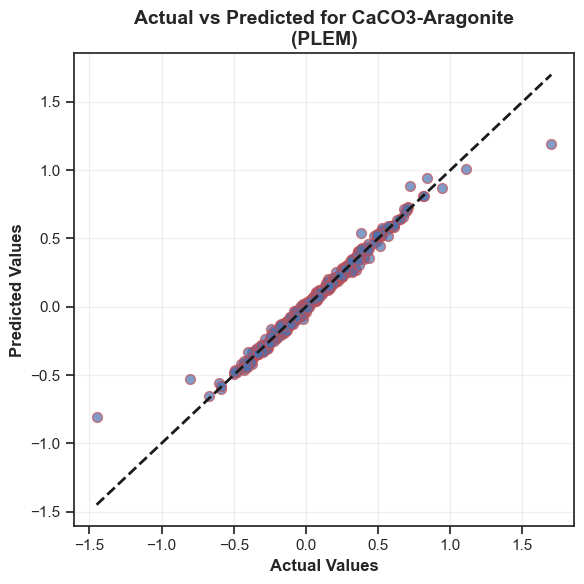

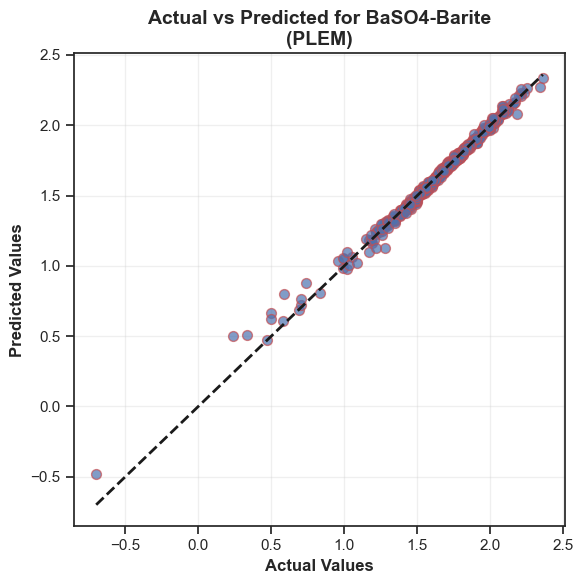

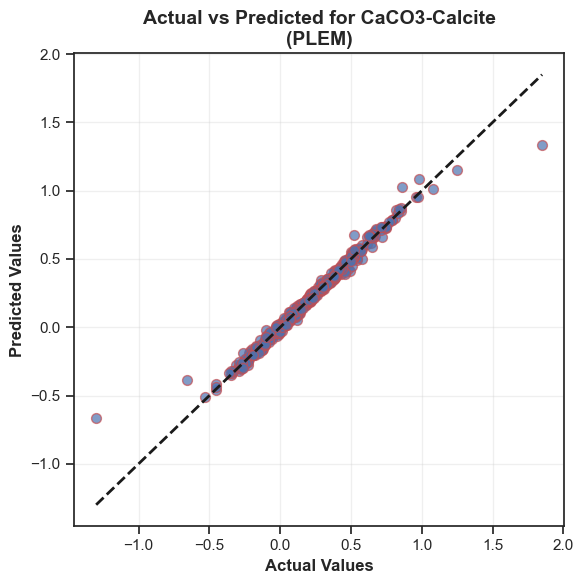

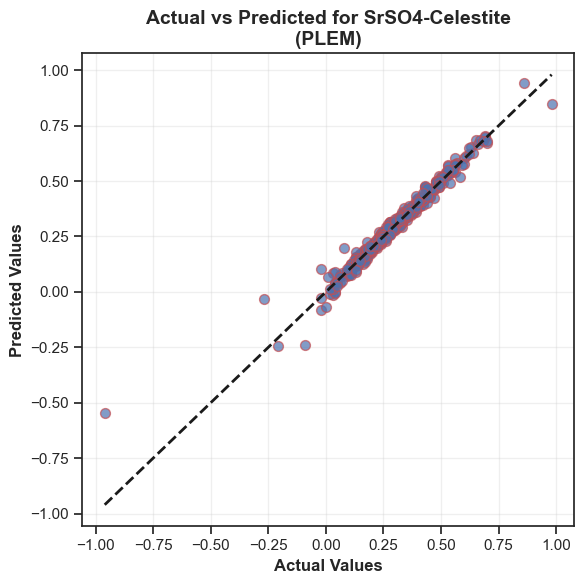

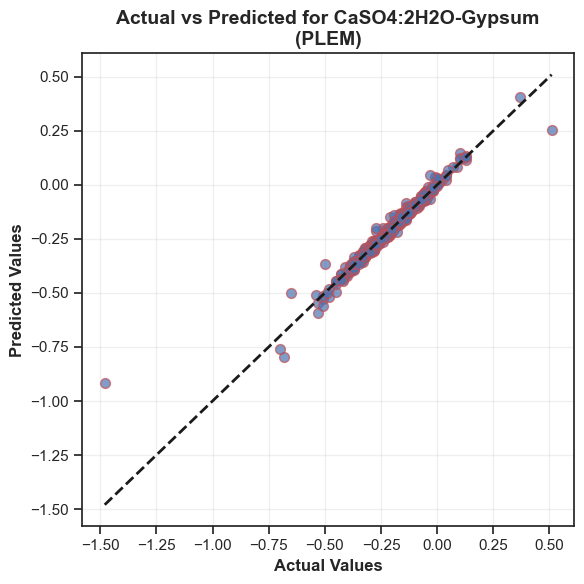

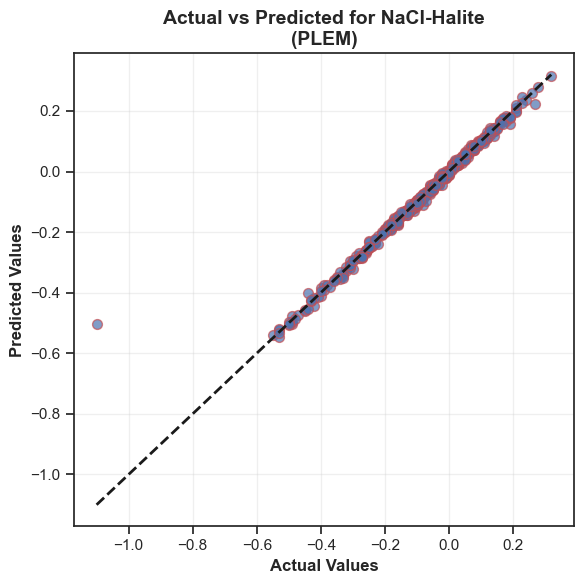

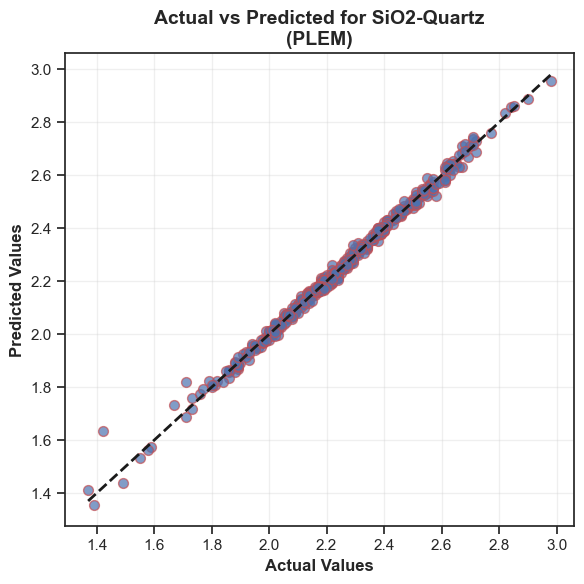

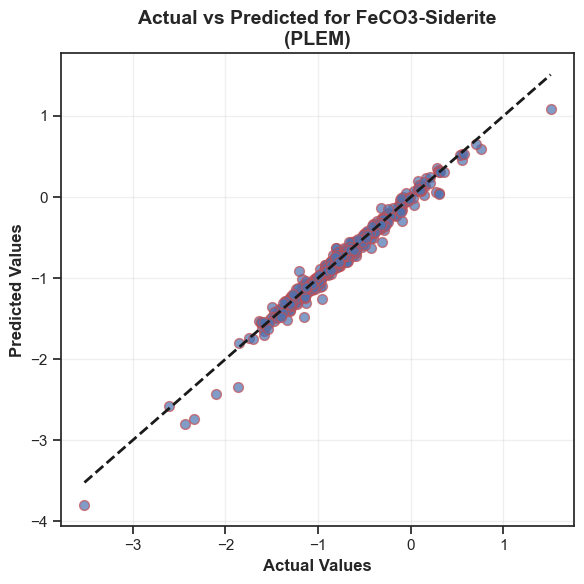

In [49]:
# Plotting ensemble predictions vs actual values
ensemble_predictions = {
    # 'Ensemble-Averaging': ensemble_avg_pred,
    # 'Ensemble-Weighted': ensemble_weighted_pred,
    'PLEM': Y_pred_plem
}

for ensemble_name, Y_pred_ensemble in ensemble_predictions.items():
    for i, target_col in enumerate(Y.columns):
        plt.figure(figsize=(6, 6))
        plt.scatter(
            Y_test.iloc[:, i],
            Y_pred_ensemble[:, i],
            alpha=0.7,
            edgecolors='r',
            s=50
        )
        plt.plot(
            [Y_test.iloc[:, i].min(), Y_test.iloc[:, i].max()],
            [Y_test.iloc[:, i].min(), Y_test.iloc[:, i].max()],
            'k--',
            linewidth=2
        )
        plt.title(f'Actual vs Predicted for {target_col}\n({ensemble_name})',
                  fontsize=14, fontweight='bold')
        plt.xlabel('Actual Values', fontsize=12, fontweight='bold')
        plt.ylabel('Predicted Values', fontsize=12, fontweight='bold')
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

### **6.6. SHAP Analysis for Ensemble Models**

d:\anaconda3\Lib\site-packages\shap\explainers\_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


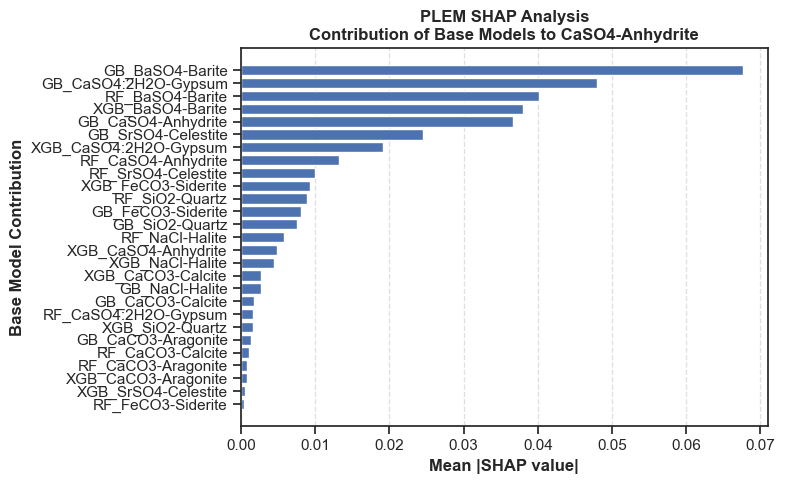

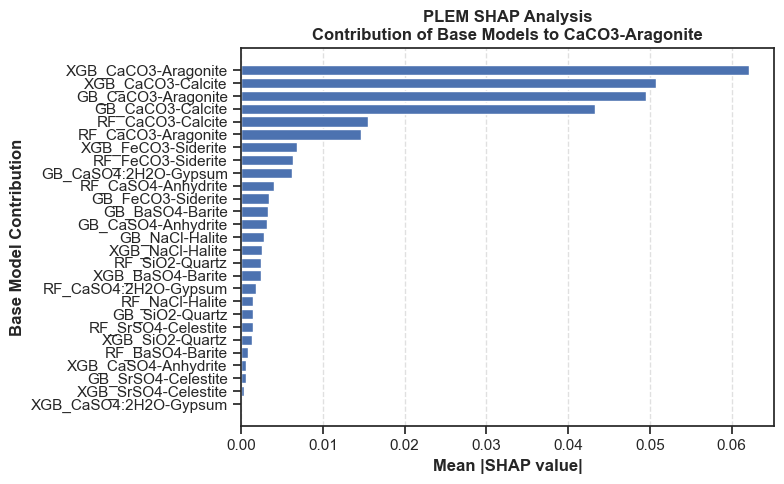

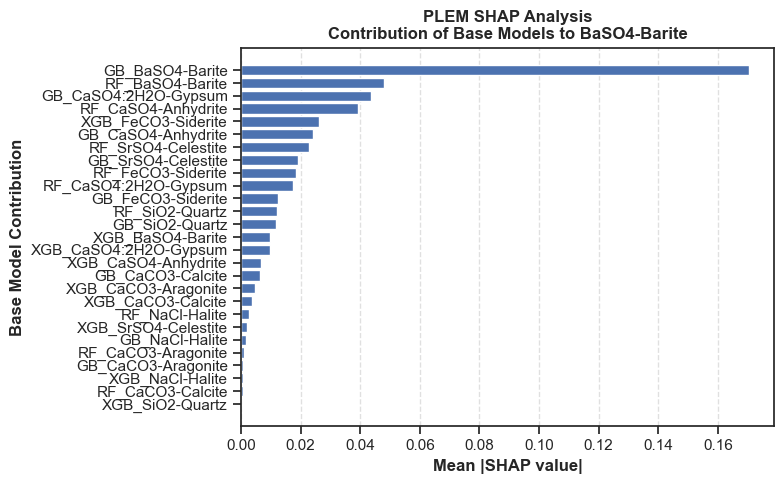

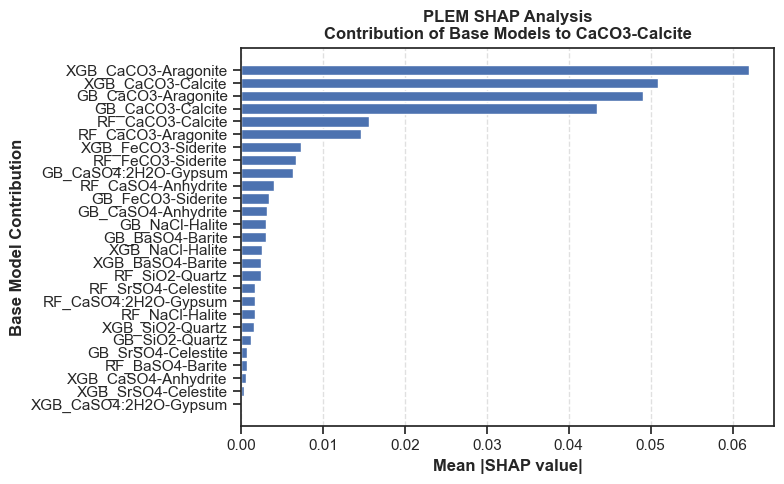

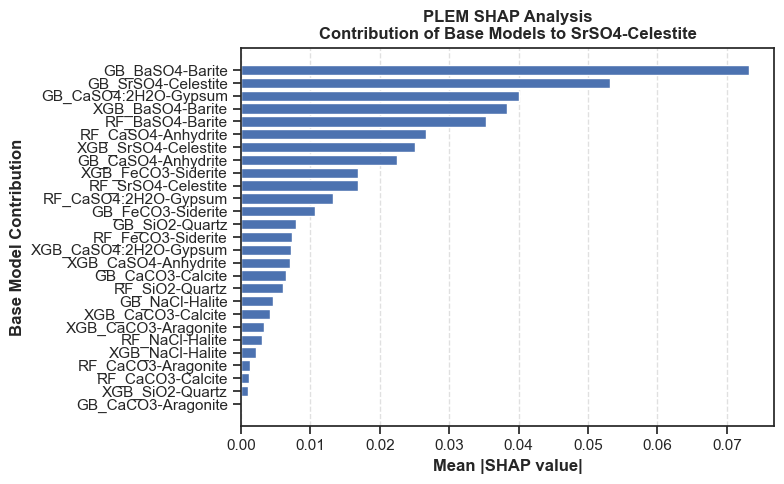

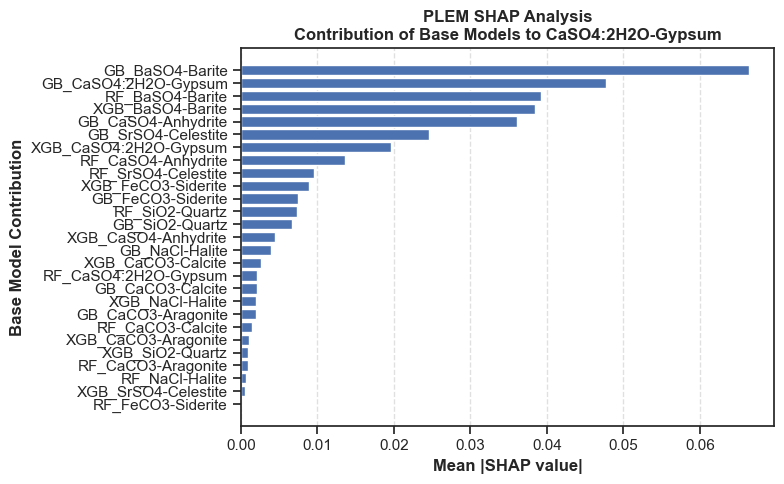

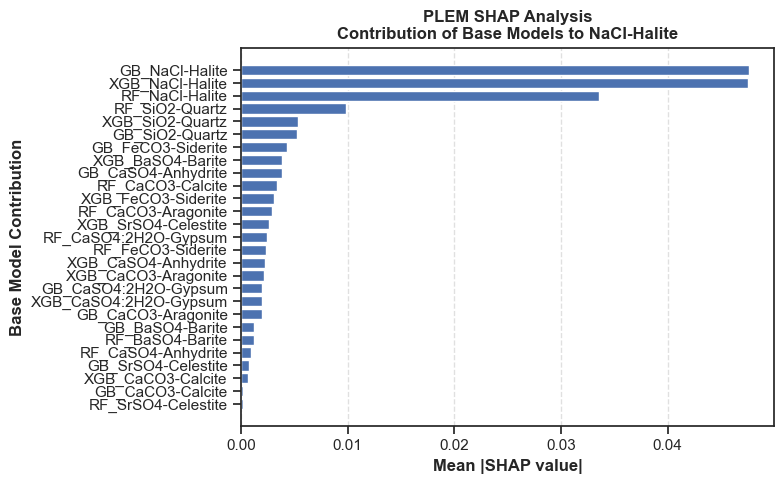

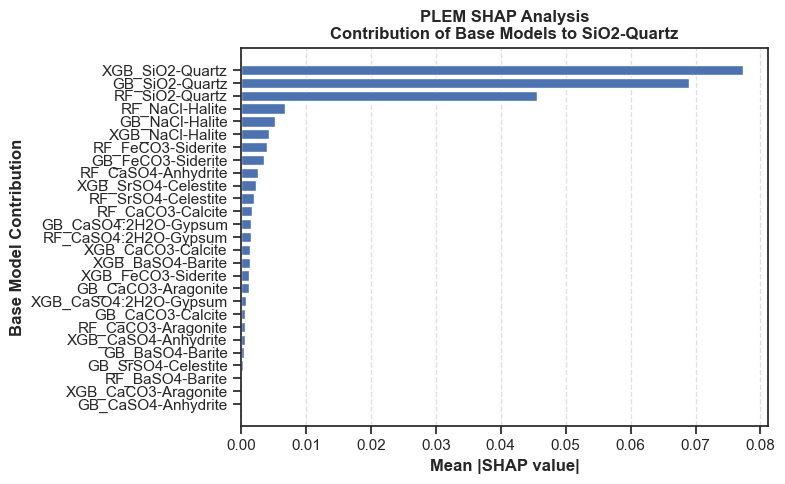

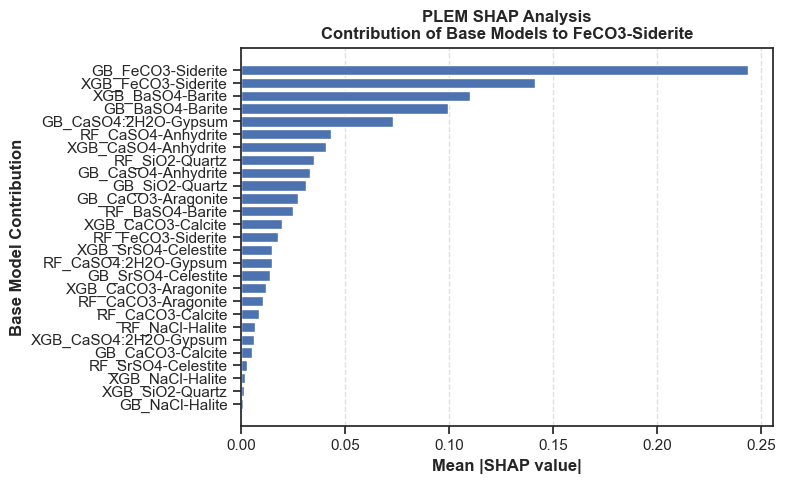

In [50]:
base_model_names = ['RF', 'XGB', 'GB']
target_names = Y.columns.tolist()

meta_feature_names = []
for m in base_model_names:
    for t in target_names:
        meta_feature_names.append(f"{m}_{t}")
    
explainer = shap.LinearExplainer(
    meta_model,
    meta_X_train,
    feature_perturbation="interventional"
)

shap_values = explainer.shap_values(meta_X_test)

for i, target_name in enumerate(target_names):

    mean_abs_shap = np.mean(np.abs(shap_values[:, :, i]), axis=0)
    sorted_idx = np.argsort(mean_abs_shap)

    plt.figure(figsize=(8, 5))
    plt.barh(
        np.array(meta_feature_names)[sorted_idx],
        mean_abs_shap[sorted_idx]
    )

    plt.xlabel("Mean |SHAP value|", fontweight="bold")
    plt.ylabel("Base Model Contribution", fontweight="bold")
    plt.title(
        f"PLEM SHAP Analysis\n"
        f"Contribution of Base Models to {target_name}",
        fontweight="bold"
    )

    plt.grid(axis="x", linestyle="--", alpha=0.6)
    plt.tight_layout()
    plt.show()
